In [1]:
import numpy as np
import matplotlib.pyplot as plt
#from sklearn import svm, datasets
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')  # "error", "ignore", "always", "default", "module" or "once"

In [2]:
#------------------------------------------------------------------------------
# 1- Split into a training set and a test set using a ShuffleSplit + doing that in parallel for the differrent features to test
#------------------------------------------------------------------------------

from sklearn.model_selection import ShuffleSplit
def split_data(X, y, test_size=.25, train_size=None) :
    

    rs = ShuffleSplit(n_splits=1, test_size=test_size, train_size=train_size, random_state=0)
    for index_train, index_test in rs.split(y): pass

    X_train, X_test = {}, {}
    X_train, X_test = X[index_train, :], X[index_test, :]
    y_train, y_test =  y[index_train].copy(), y[index_test].copy()

    print('nb_trial_train : X: %s, y: %s'%(X_train.shape[0], y_train.shape[0]), end='\t')
    print('nb_trial_test : X: %s,  y: %s'%(X_test.shape[0], y_test.shape[0]))
    
    #------------------------------------------------------------------------------
    # 2- normalization TODO: check in mode edge if that normalization is fine
    #------------------------------------------------------------------------------
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    
    X_train = scaler.fit_transform(X_train)
    scaler.fit(X)
    X_test = scaler.transform(X_test)
    
    return X_train, X_test, y_train, y_test

In [3]:
#------------------------------------------------------------------------------
# 4- Train a SVM classification model
#------------------------------------------------------------------------------

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

def Train_SVM(X_train, y_train, size_c_gamma=32, ax=None, fig=None, plot=None) :


    C_range = np.logspace(-5, 10., size_c_gamma, base=2.)
    gamma_range = np.logspace(-14, 3, size_c_gamma, base=2.)

    #param_grid = [{'kernel': ['rbf', 'poly', 'sigmoid'], 'gamma': gamma_range, 'C': C_range}, {'kernel': ['linear'], 'C': C_range}]
    
    liste_kernel = ['rbf']#, 'poly', 'sigmoid']
    param_grid = [{'kernel': liste_kernel, 'gamma': gamma_range, 'C': C_range}]

    
    grid = GridSearchCV(SVC(verbose=False, tol=1e-3, max_iter = -1, class_weight='balanced'),
                        param_grid, verbose=0, scoring='balanced_accuracy', n_jobs=1,) #cv=50, 
    

    X_train_ = np.zeros((len(X_train), 0))
    X_train_ = np.hstack((X_train_, X_train))
    grid.fit(X_train, y_train.ravel())


    # plot the scores of the grid
    #score_dict = grid.grid_scores_ # grid_scores_ contains parameter settings and scores
    
    means = grid.cv_results_['mean_test_score']
    stds = grid.cv_results_['std_test_score']
    
    scores_mean, scores_std = {}, {}
    #for params, mean_score, scores in score_dict:
    for mean_score, std, params in zip(means, stds, grid.cv_results_['params']):
        try :
            scores_mean[params['kernel']].append(mean_score)
            scores_std[params['kernel']].append(std)
        except:
            scores_mean[params['kernel']] = []
            scores_std[params['kernel']] = []
            scores_mean[params['kernel']].append(mean_score)
            scores_std[params['kernel']].append(std)


    # draw heatmap of accuracy as a function of gamma and C
    if plot is None :
        fig, ax = plt.subplots(1,1,figsize=(5,5))

    for x, k in enumerate(['rbf']): #, 'poly', 'sigmoid']) :
        scores = np.array(scores_mean[k]).reshape((gamma_range.shape[0], C_range.shape[0]))
        im = ax.imshow(scores, interpolation='nearest', cmap=plt.cm.gray, vmin=0, vmax=1)
        ax.set_xlabel('gamma')
        ax.set_ylabel('C')
        #ax.set_colorbar()

        ax.set_xticks(range(0, len(gamma_range), 5))
        ax.set_yticks(range(0, len(C_range), 5))
        ax.set_xticklabels(['%0.4f'%gamma_range[num] for num in range(0, len(gamma_range), 5)])
        ax.set_yticklabels(['%0.4f'%C_range[num] for num in range(0, len(C_range), 5)])
        
        
        ax.set_title(k)
        fig.colorbar(im, ax=ax, pad=0.01, fraction=.047)
    
    if plot is None :
        fig.tight_layout()
        plt.show()
    
    print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
    
    if plot is None : return grid
    else : return ax, fig, grid

In [4]:
#------------------------------------------------------------------------------
# 5- Quantitative evaluation of the model quality on the test set
#------------------------------------------------------------------------------
def Quantitative_evaluation(grid, X_test, classes, ax=None, fig=None, plot=None) :

    import itertools
    from sklearn import metrics
    from sklearn.metrics import classification_report
    from sklearn.metrics import confusion_matrix

    
    y_pred = grid.predict(X_test)
    
    fone_score = np.array(metrics.f1_score(y_test, y_pred, average=None)).mean()
    #fone_score = np.array(metrics.balanced_accuracy_score(y_test, y_pred)).mean()
    
    cm = confusion_matrix(y_test, y_pred)
    norm_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    if plot is None : fig, ax = plt.subplots(1,1,figsize=(5,5))
    im = ax.imshow(norm_cm, interpolation='nearest', cmap=plt.cm.Reds, vmin=0, vmax=1)
    
    ax.set_title('Confusion matrix\n(fone_score on test => Accuracy = %0.2f)' % (fone_score))
    fig.colorbar(im, ax=ax, pad=0.01, fraction=.047)
    
    tick_marks = np.arange(len(classes))
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)
    ax.set_xticklabels(classes)
    ax.set_yticklabels(classes)
    
    thresh = norm_cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, 'nb_trial = %s\n\n(%.0f %%)'%(cm[i, j], norm_cm[i, j]*100),
                 ha="center", color="white" if norm_cm[i, j] > thresh else "black")
        if i==j :
            ax.text(j, i+0.2, 'f1_score = %.2f'%(metrics.f1_score(y_test, y_pred, average=None)[i]),
                 ha="center", color="white" if norm_cm[i, j] > thresh else "black")
    
    ax.set_ylabel('True label')
    ax.set_xlabel('Predicted label')
    
    if plot is None :
        plt.tight_layout()
        plt.show()

        return y_pred
    else :
        return ax, fig, y_pred

In [5]:
from sklearn import metrics

def fig_final(X_train, y_train, X_test, y_test, var, classes) : #grid, y_pred, 
    
    for x1 in range(X_train.shape[1]) :

        
        x=0
        for x2 in range(x1, X_train.shape[1]) :
            if x2 != x1 :
                
                fig, ax = plt.subplots(1,3,figsize=(10*3,10))
        
                print('-'*50, '\n\t\t%s - %s\n'%(var[x1], var[x2]), '-'*50, sep='')

                X_fit = [[],[]]
                X_fit[0], X_fit[1] = X_train[:, x1], X_train[:, x2]
                X_fit = np.array(X_fit).transpose()
                
                X_t = [[],[]]
                X_t[0], X_t[1] = X_test[:, x1], X_test[:, x2]
                X_t = np.array(X_t).transpose()
                

                ax[0], fig, grid = Train_SVM(X_fit, y_train, size_c_gamma=32, ax=ax[0], fig=fig, plot=True) #size_c_gamma=32
                ax[1], fig, y_pred = Quantitative_evaluation(grid, X_t, classes, ax=ax[1], fig=fig, plot=True)
                
                if grid.best_params_['kernel'] != 'linear' :
                    clf = SVC(kernel=grid.best_params_['kernel'], C=grid.best_params_['C'], gamma=grid.best_params_['gamma'])
                else :
                    clf = SVC(kernel=grid.best_params_['kernel'], C=grid.best_params_['C'])
      
                clf.fit(X_fit, y_train)
                
                del grid
                

                try :
                    h=.05
                    X0, X1 = X_fit[:, 0], X_fit[:, 1]
                    x_min, x_max = X0.min() - 1, X0.max() + 1
                    y_min, y_max = X1.min() - 1, X1.max() + 1

                    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                                         np.arange(y_min, y_max, h))

                    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
                    Z = Z.reshape(xx.shape)
                    ax[2].contourf(xx, yy, Z, cmap=plt.cm.RdGy, alpha=0.5)
                    del Z
                
                except : pass
                    
                # plot support vectors
                ax[2].scatter(X_train[:, x1], X_train[:, x2], c=y_train, s=200, cmap=plt.cm.RdGy, alpha=0.3)
                
                y_pred2 = clf.predict(X_t)                
                del clf, X_t, X_fit

                ax[2].scatter(X_test[:, x1], X_test[:, x2], c=y_pred, s=40, cmap=plt.cm.RdGy, lw=1, edgecolors='k')

                for a in range(len(y_test)) :
                    if y_test[a]!=y_pred[a] :
                        ax[2].scatter(X_test[a, x1], X_test[a, x2], facecolor='none', s=60, lw=2,
                                   edgecolors=plt.cm.RdGy(y_test[a]))

                ax[2].set_xlabel('%s'%var[x1])
                ax[2].set_ylabel('%s'%var[x2])
                x=x+1

            plt.show()

# Data

In [6]:
import pickle
import os
from ANEMO import read_edf
from ANEMO import ANEMO
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
sujet = ['AM','BMC','CS','DC','FM','IP','LB','OP','RS','SR','TN','YK']
time = ['2017-10-23_100057','2017-09-26_095637', '2017-10-03_134421','2017-09-27_161040',
        '2017-10-03_143803','2017-09-28_115250', '2017-09-20_151043','2017-10-26_121823',
        '2017-11-08_094717','2017-11-16_153313', '2017-11-08_150410','2017-11-17_172706']

file = os.path.join('parametre', 'Delete_list_trials_velocity_fct.pkl')
with open(file, 'rb') as fichier : Delete_list_trials = pickle.load(fichier, encoding='latin1')

file = os.path.join('parametre', 'Delete_list_Bad_trials_velocity.pkl')
with open(file, 'rb') as fichier : Bad_Fit = pickle.load(fichier, encoding='latin1')

In [7]:
list_keys_param_fit = ['start_anti', 'tau', 'v_anti', 'latence', 'maxi']
X, y, var = [], [], []
a = 0
for x in range(len(sujet)) :
    
    #-------------------------------------------------------------------------
    file = os.path.join('data', 'enregistrement_' + sujet[x] + '_' + time[x] + '.pkl')
    with open(file, 'rb') as fichier : param_exp = pickle.load(fichier, encoding='latin1')
    A = ANEMO(param_exp)
    N_trials, N_blocks = param_exp['N_trials'], param_exp['N_blocks']

    resultats = os.path.join('data', 'enregistrement_' + sujet[x] + '_' + time[x] + '.asc')
    data = read_edf(resultats, 'TRIALID')

    file = os.path.join('parametre/goodness_of_fit_'+ sujet[x] +'.pkl')
    with open(file, 'rb') as fichier : goodness_of_fit = pickle.load(fichier, encoding='latin1')
    
    file = os.path.join('parametre/param_Fit_'+ sujet[x] +'_fct_velocity_2_step_False_whitening.pkl')
    with open(file, 'rb') as fichier : param_fit = pickle.load(fichier, encoding='latin1')
    #-------------------------------------------------------------------------

    nb_del_trial = [len(Delete_list_trials[sujet[x]][b]) for b in range(N_blocks)]
    nb_bad_trial = [len(Bad_Fit[sujet[x]][b]) for b in range(N_blocks)]
    print('%s -- nb_Delete_trials = %s, nb_Bad_Fit = %s'%(sujet[x], nb_del_trial, nb_bad_trial))
    #-------------------------------------------------------------------------
    
    for block in range(N_blocks) :
        for trial in range(N_trials) :

            if trial in Delete_list_trials[sujet[x]][block] : y.append(1)
            elif trial in Bad_Fit[sujet[x]][block] : y.append(1)
            else : y.append(0)

            if a==0 :
                var.append('nb_nan_GAP') ; X.append([])
                var.append('nb_nan_anti') ; X.append([])
                var.append('nb_nan_200') ; X.append([])
                var.append('nb_nan_rise') ; X.append([])
                
                var.append('residu_GAP') ; X.append([])
                var.append('residu_anti') ; X.append([])
                var.append('residu_200') ; X.append([])
                var.append('residu_rise') ; X.append([])
                #for key in goodness_of_fit.keys() :
                #    if key!='residual' : var.append(key) ; X.append([])
                for key in param_fit.keys() :
                    if key in list_keys_param_fit : var.append(key) ; X.append([])
                a=1
            
            trial_data = trial + N_trials*block
            arg = A.arg(data[trial_data], trial=trial, block=block)
            velocity_NAN = A.velocity_NAN(**arg)[0]
            
            onset = arg.TargetOn-arg.t_0
            start_anti = int(param_fit['start_anti'][block][trial])+onset
            latence = int(param_fit['latence'][block][trial])+onset
            
            
            nb_nan = [x for x in velocity_NAN[arg.StimulusOf-arg.t_0:arg.TargetOn-arg.t_0] if str(x)=='nan']
            X[0].append(len(nb_nan)/len(velocity_NAN[arg.StimulusOf-arg.t_0:arg.TargetOn-arg.t_0]))
            
            nb_nan = [x for x in velocity_NAN[start_anti:latence] if str(x)=='nan']
            X[1].append(len(nb_nan)/len(velocity_NAN[start_anti:latence]))
            
            nb_nan = [x for x in velocity_NAN[start_anti:latence] if str(x)=='nan']
            X[2].append(len(nb_nan)/len(velocity_NAN[latence-200:latence]))
            
            nb_nan = [x for x in velocity_NAN[latence:len(velocity_NAN)-280] if str(x)=='nan']
            X[3].append(len(nb_nan)/len(velocity_NAN[latence:len(velocity_NAN)-280]))
            

            t1 , res = 0, np.zeros(len(velocity_NAN)-280)
            for t in range(len(velocity_NAN)-280) :
                if np.isnan(velocity_NAN[t]) : res[t] = np.nan
                else : res[t] = abs(goodness_of_fit['residual'][block][trial][t1]) ; t1 = t1+1

            if np.isnan(np.nanmean(res[arg.StimulusOf-arg.t_0:arg.TargetOn-arg.t_0])) : X[4].append(0)
            else : X[4].append(np.nanmean(res[arg.StimulusOf-arg.t_0:arg.TargetOn-arg.t_0]))
                
            if np.isnan(np.nanmean(res[start_anti:latence])) : X[5].append(0)
            else : X[5].append(np.nanmean(res[start_anti:latence]))
                
            if np.isnan(np.nanmean(res[latence-200:latence])) : X[6].append(0)
            else : X[6].append(np.nanmean(res[latence-200:latence]))
                
            if np.isnan(np.nanmean(res[latence:])) : X[7].append(0)
            else : X[7].append(np.nanmean(res[latence:]))

            k = 8
            #for key in goodness_of_fit.keys() :
            #    if key!='residual' : X[k].append(goodness_of_fit[key][block][trial]) ; k=k+1
            for key in param_fit.keys() :
                if key in list_keys_param_fit : X[k].append(param_fit[key][block][trial]) ; k=k+1

AM -- nb_Delete_trials = [0, 1, 0], nb_Bad_Fit = [1, 0, 0]
BMC -- nb_Delete_trials = [2, 7, 2], nb_Bad_Fit = [0, 1, 3]
CS -- nb_Delete_trials = [0, 0, 2], nb_Bad_Fit = [3, 16, 10]
DC -- nb_Delete_trials = [3, 7, 2], nb_Bad_Fit = [6, 7, 6]
FM -- nb_Delete_trials = [22, 11, 3], nb_Bad_Fit = [3, 3, 3]
IP -- nb_Delete_trials = [0, 1, 0], nb_Bad_Fit = [0, 0, 0]
LB -- nb_Delete_trials = [10, 7, 7], nb_Bad_Fit = [12, 11, 6]
OP -- nb_Delete_trials = [29, 19, 22], nb_Bad_Fit = [16, 29, 32]
RS -- nb_Delete_trials = [0, 2, 5], nb_Bad_Fit = [1, 7, 1]
SR -- nb_Delete_trials = [8, 2, 2], nb_Bad_Fit = [5, 23, 5]
TN -- nb_Delete_trials = [7, 3, 5], nb_Bad_Fit = [11, 7, 4]
YK -- nb_Delete_trials = [66, 35, 22], nb_Bad_Fit = [64, 75, 66]


In [8]:
classes = ['keep', 'reject']

X1 = np.array(X)
y1 = np.array(y)
X1 = X1.transpose()
print(X1.shape)

(7200, 13)


In [9]:
X_train, X_test, y_train, y_test = split_data(X1, y1, test_size=.7, train_size=None)
print('nb_Bad_trial in y_train : %s'%(len(y_train[y_train>0])))
print('nb_Bad_trial in y_test : %s'%(len(y_test[y_test>0])))

nb_trial_train : X: 2160, y: 2160	nb_trial_test : X: 5040,  y: 5040
nb_Bad_trial in y_train : 184
nb_Bad_trial in y_test : 431


--------------------------------------------------
		nb_nan_GAP - nb_nan_anti
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.72


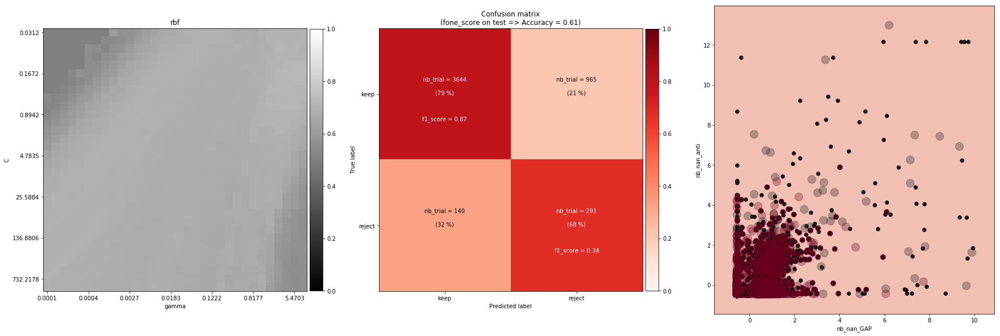

--------------------------------------------------
		nb_nan_GAP - nb_nan_200
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.70


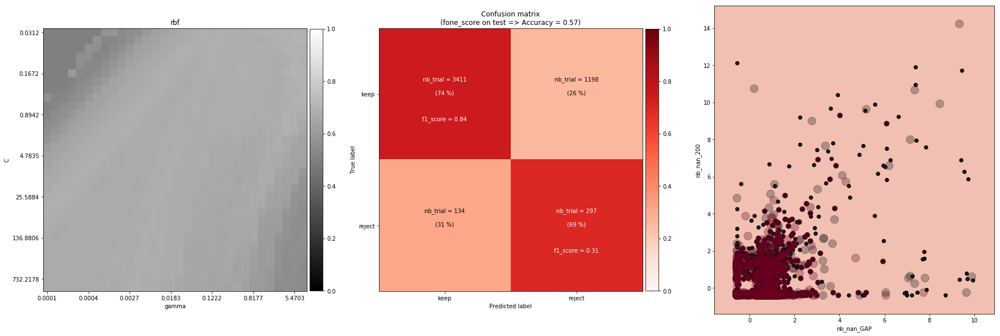

--------------------------------------------------
		nb_nan_GAP - nb_nan_rise
--------------------------------------------------
The best parameters are {'C': 0.08547301972039952, 'gamma': 0.8177191994837885, 'kernel': 'rbf'} with a score of 0.75


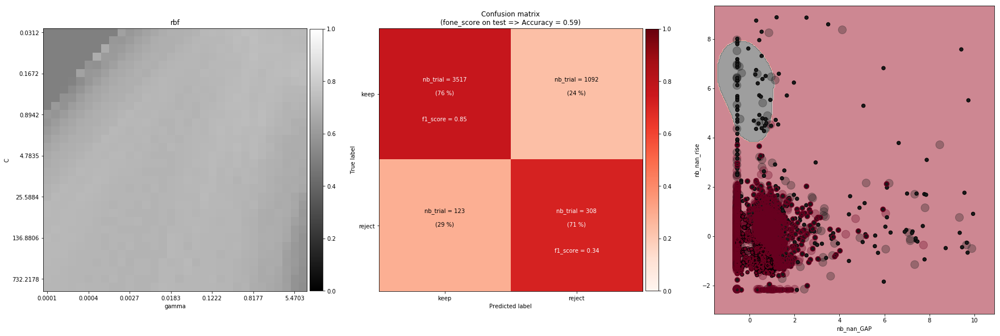

--------------------------------------------------
		nb_nan_GAP - residu_GAP
--------------------------------------------------
The best parameters are {'C': 0.4572223213336258, 'gamma': 0.8177191994837885, 'kernel': 'rbf'} with a score of 0.69


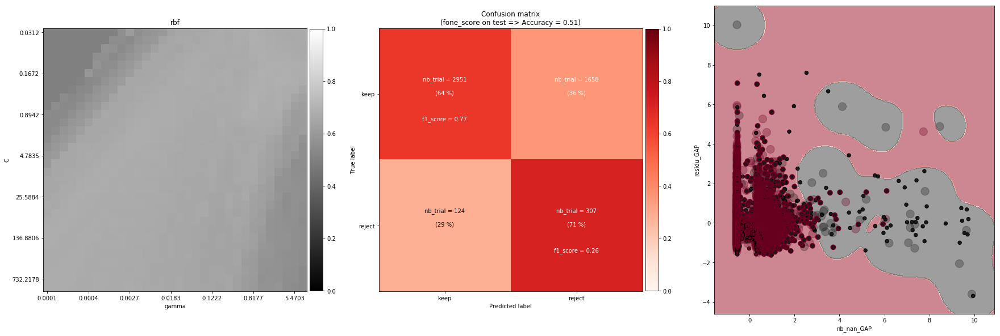

--------------------------------------------------
		nb_nan_GAP - residu_anti
--------------------------------------------------
The best parameters are {'C': 0.08547301972039952, 'gamma': 1.748904622119495, 'kernel': 'rbf'} with a score of 0.70


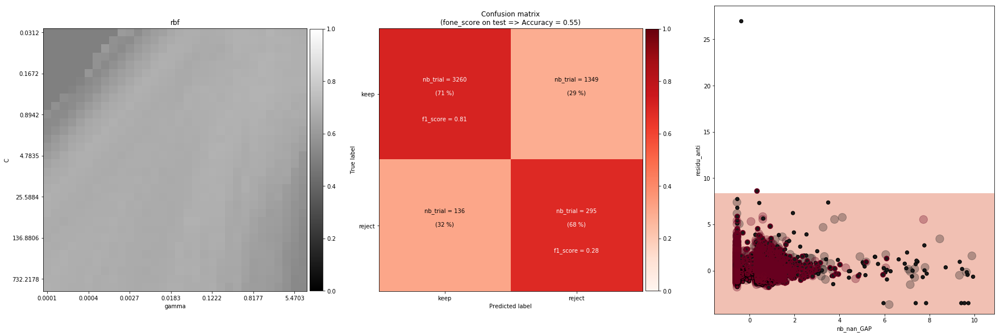

--------------------------------------------------
		nb_nan_GAP - residu_200
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 0.8177191994837885, 'kernel': 'rbf'} with a score of 0.70


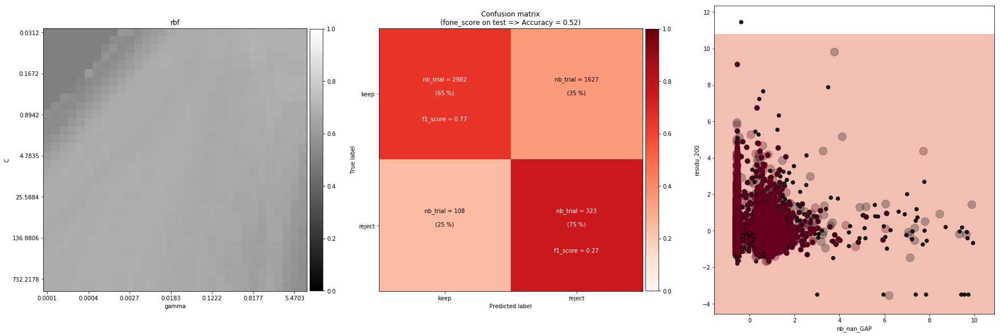

--------------------------------------------------
		nb_nan_GAP - residu_rise
--------------------------------------------------
The best parameters are {'C': 0.23378038720396177, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.72


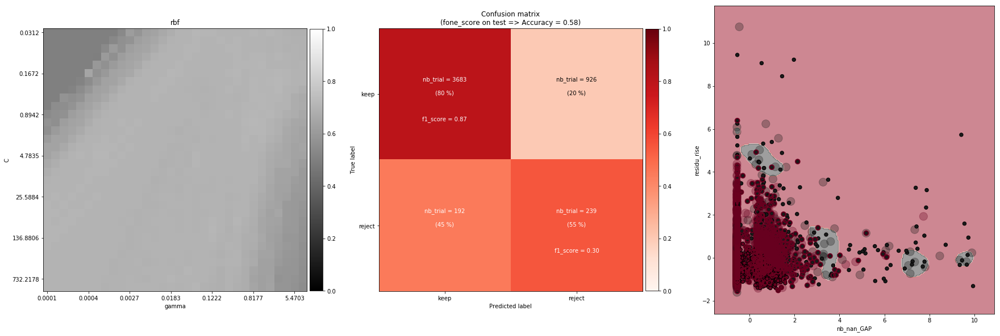

--------------------------------------------------
		nb_nan_GAP - start_anti
--------------------------------------------------
The best parameters are {'C': 0.043702843700726655, 'gamma': 0.08358308615055099, 'kernel': 'rbf'} with a score of 0.68


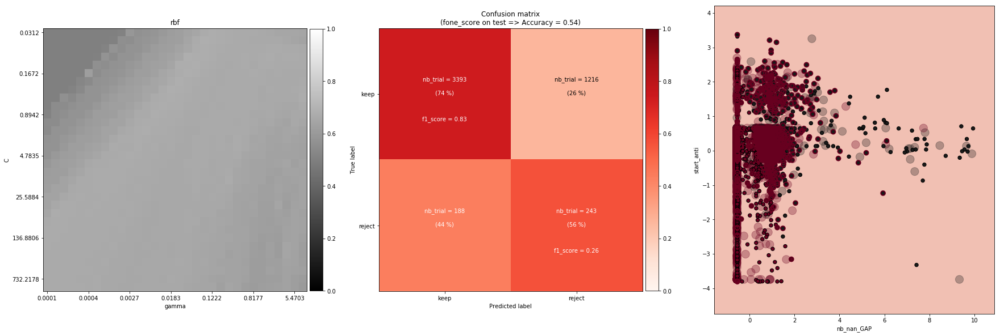

--------------------------------------------------
		nb_nan_GAP - tau
--------------------------------------------------
The best parameters are {'C': 0.4572223213336258, 'gamma': 1.195873274044141, 'kernel': 'rbf'} with a score of 0.68


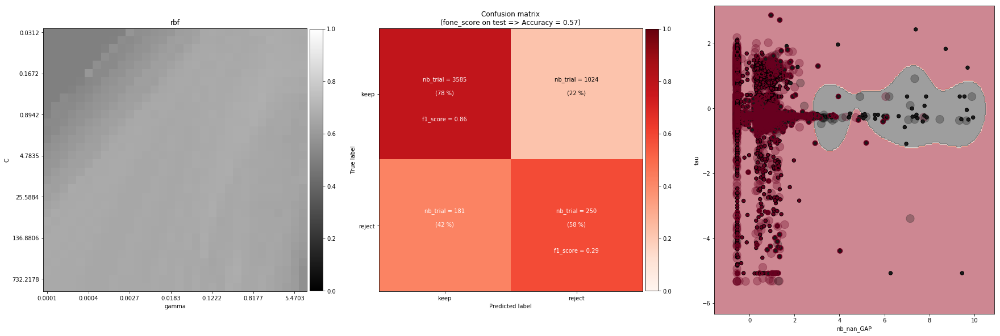

--------------------------------------------------
		nb_nan_GAP - v_anti
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.72


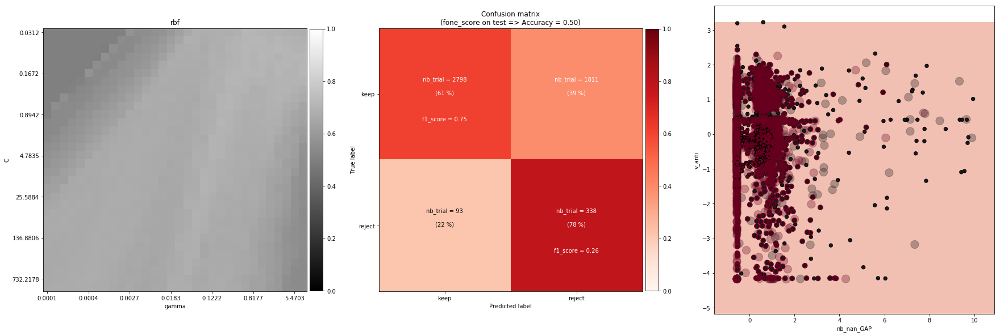

--------------------------------------------------
		nb_nan_GAP - latence
--------------------------------------------------
The best parameters are {'C': 0.6394213006632598, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.72


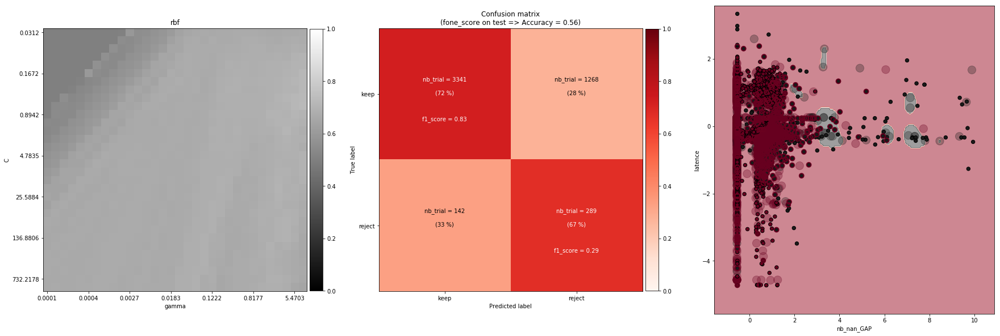

--------------------------------------------------
		nb_nan_GAP - maxi
--------------------------------------------------
The best parameters are {'C': 0.08547301972039952, 'gamma': 3.740486195263386, 'kernel': 'rbf'} with a score of 0.74


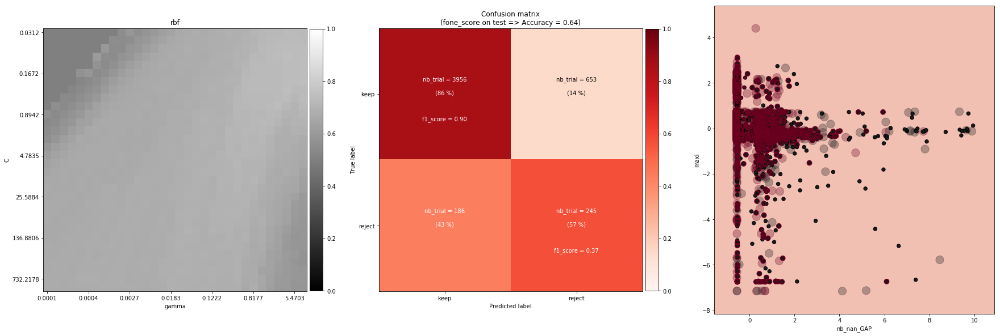

--------------------------------------------------
		nb_nan_anti - nb_nan_200
--------------------------------------------------
The best parameters are {'C': 136.88060141709667, 'gamma': 0.05715279016670322, 'kernel': 'rbf'} with a score of 0.71


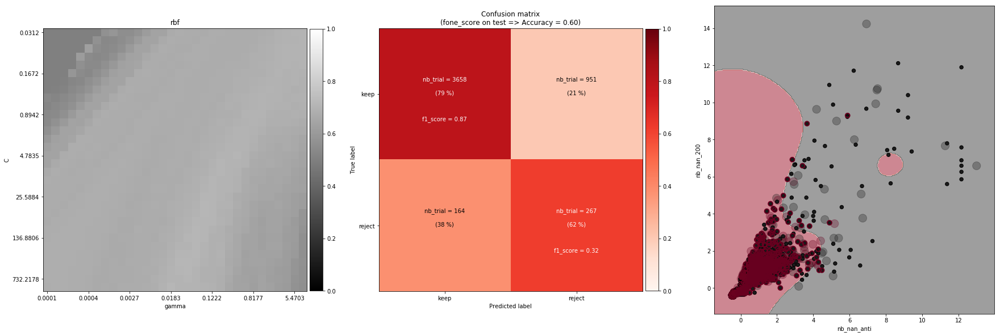

--------------------------------------------------
		nb_nan_anti - nb_nan_rise
--------------------------------------------------
The best parameters are {'C': 0.043702843700726655, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.75


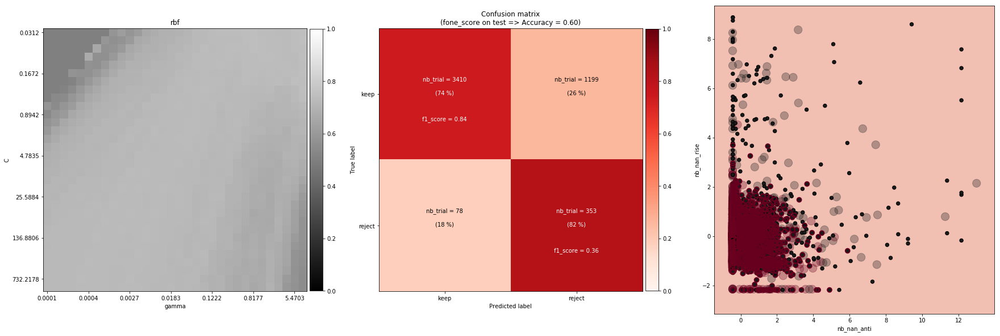

--------------------------------------------------
		nb_nan_anti - residu_GAP
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.73


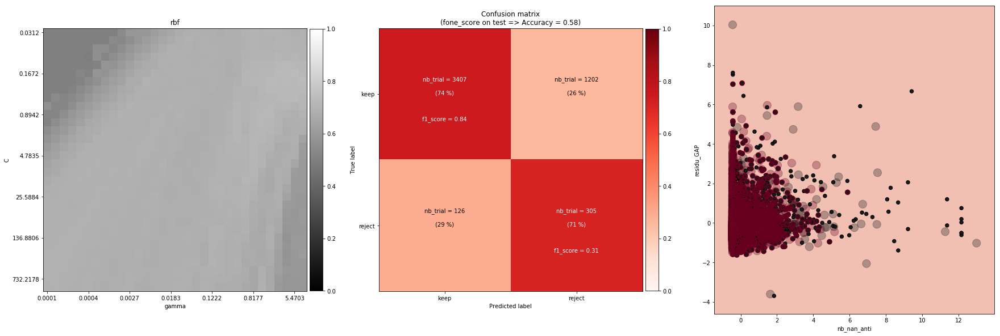

--------------------------------------------------
		nb_nan_anti - residu_anti
--------------------------------------------------
The best parameters are {'C': 1024.0, 'gamma': 0.03908017248795583, 'kernel': 'rbf'} with a score of 0.73


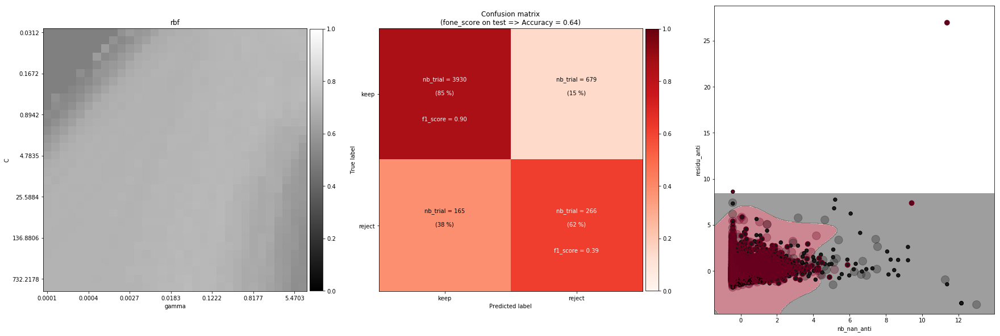

--------------------------------------------------
		nb_nan_anti - residu_200
--------------------------------------------------
The best parameters are {'C': 0.11953324868703187, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.73


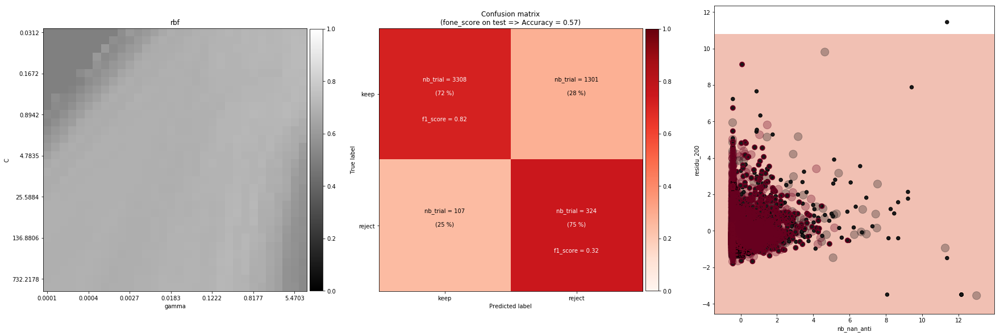

--------------------------------------------------
		nb_nan_anti - residu_rise
--------------------------------------------------
The best parameters are {'C': 25.588423395730693, 'gamma': 0.26143353705562145, 'kernel': 'rbf'} with a score of 0.76


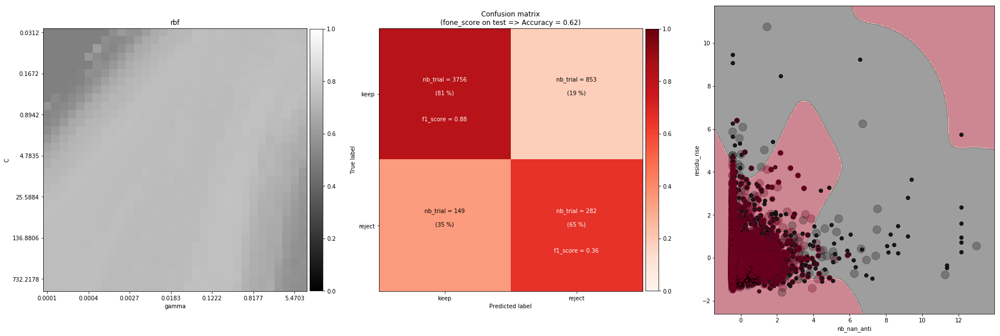

--------------------------------------------------
		nb_nan_anti - start_anti
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 3.740486195263386, 'kernel': 'rbf'} with a score of 0.72


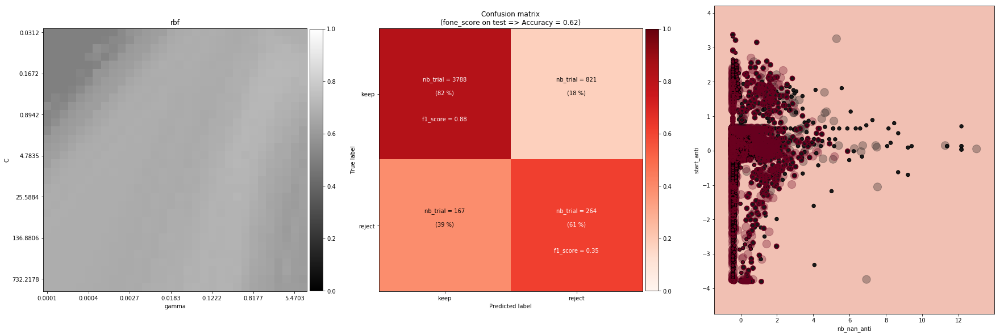

--------------------------------------------------
		nb_nan_anti - tau
--------------------------------------------------
The best parameters are {'C': 0.11953324868703187, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.73


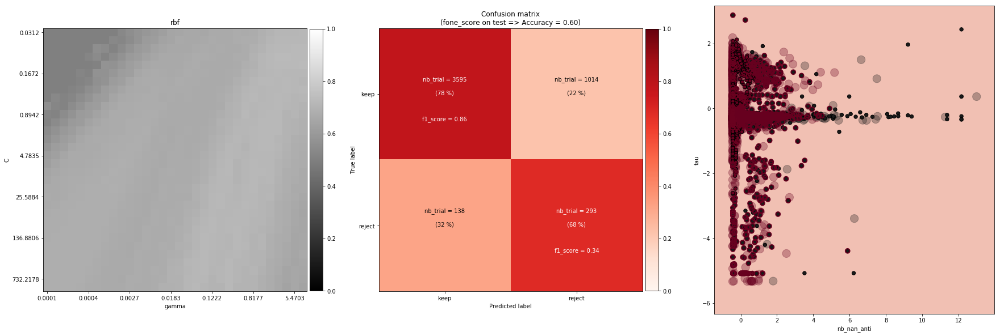

--------------------------------------------------
		nb_nan_anti - v_anti
--------------------------------------------------
The best parameters are {'C': 0.32693976711264305, 'gamma': 3.740486195263386, 'kernel': 'rbf'} with a score of 0.75


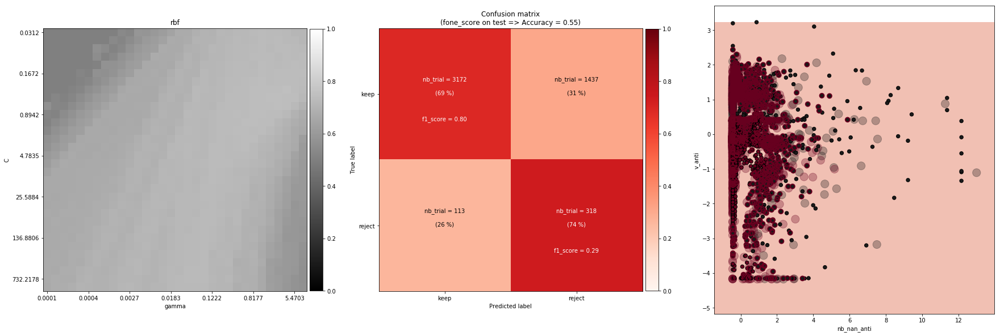

--------------------------------------------------
		nb_nan_anti - latence
--------------------------------------------------
The best parameters are {'C': 0.6394213006632598, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.75


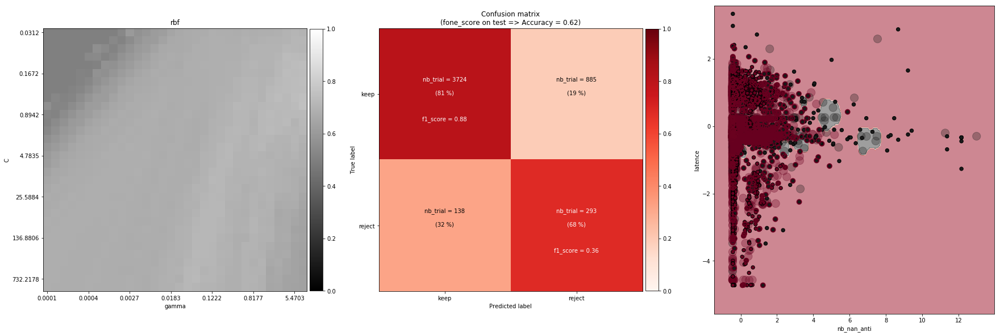

--------------------------------------------------
		nb_nan_anti - maxi
--------------------------------------------------
The best parameters are {'C': 0.11953324868703187, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.76


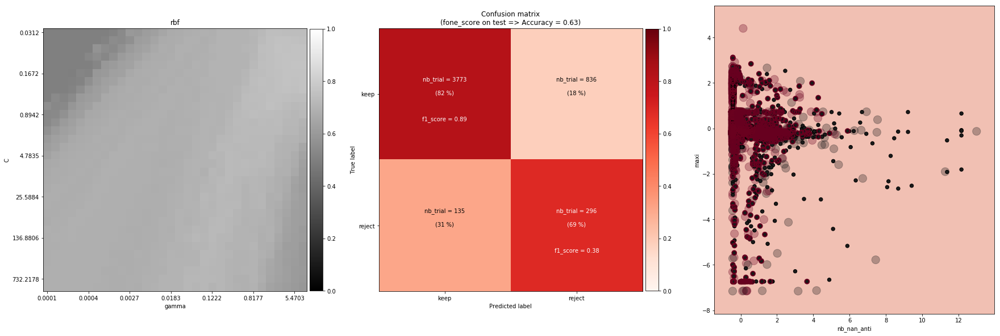

--------------------------------------------------
		nb_nan_200 - nb_nan_rise
--------------------------------------------------
The best parameters are {'C': 0.08547301972039952, 'gamma': 3.740486195263386, 'kernel': 'rbf'} with a score of 0.74


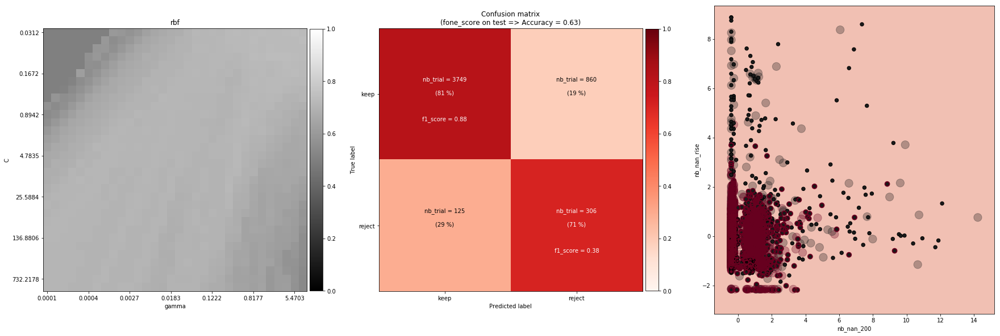

--------------------------------------------------
		nb_nan_200 - residu_GAP
--------------------------------------------------
The best parameters are {'C': 0.23378038720396177, 'gamma': 1.748904622119495, 'kernel': 'rbf'} with a score of 0.69


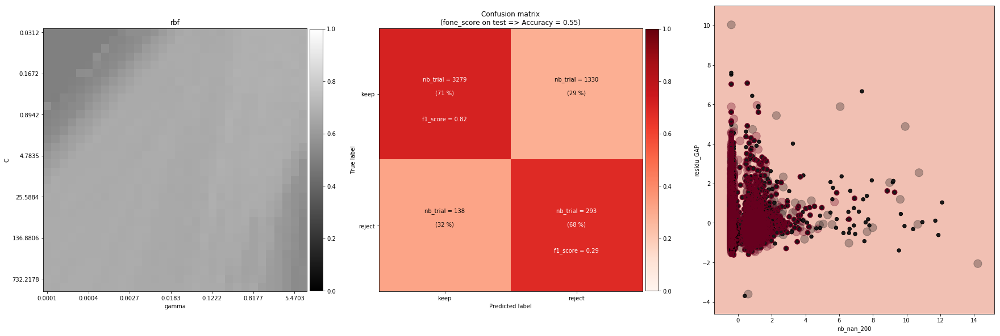

--------------------------------------------------
		nb_nan_200 - residu_anti
--------------------------------------------------
The best parameters are {'C': 0.23378038720396177, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.72


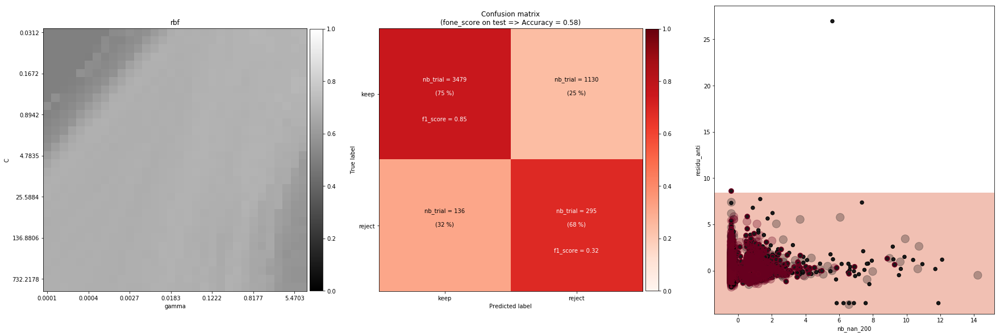

--------------------------------------------------
		nb_nan_200 - residu_200
--------------------------------------------------
The best parameters are {'C': 0.043702843700726655, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.71


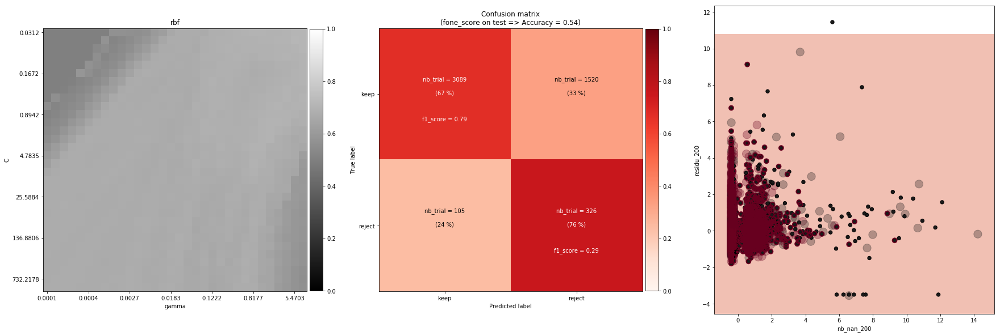

--------------------------------------------------
		nb_nan_200 - residu_rise
--------------------------------------------------
The best parameters are {'C': 0.03125, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.73


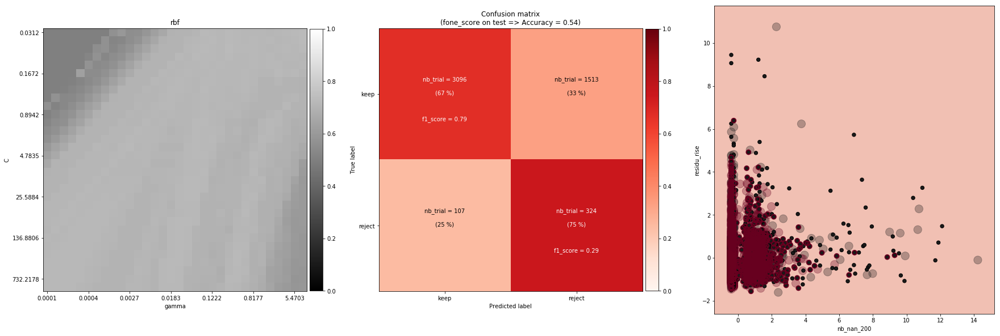

--------------------------------------------------
		nb_nan_200 - start_anti
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.71


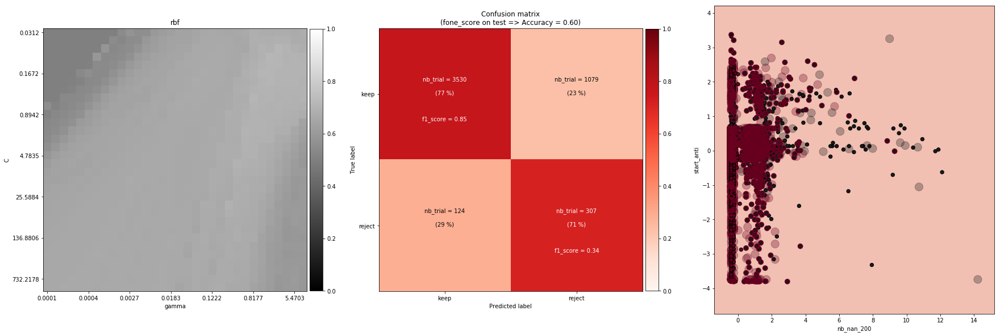

--------------------------------------------------
		nb_nan_200 - tau
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.71


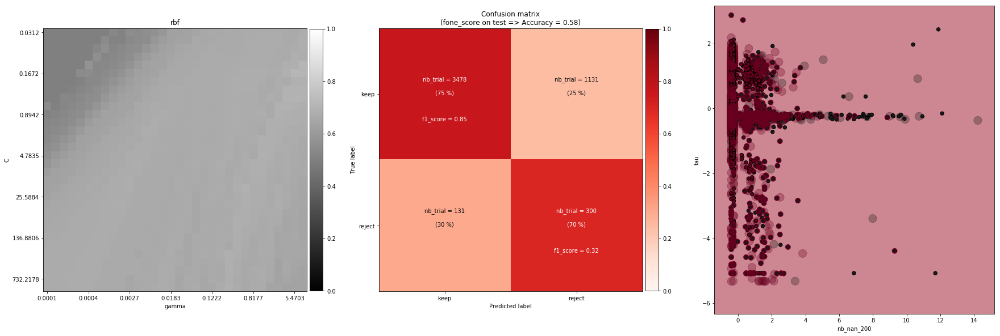

--------------------------------------------------
		nb_nan_200 - v_anti
--------------------------------------------------
The best parameters are {'C': 0.8942249331776565, 'gamma': 0.5591434341058171, 'kernel': 'rbf'} with a score of 0.74


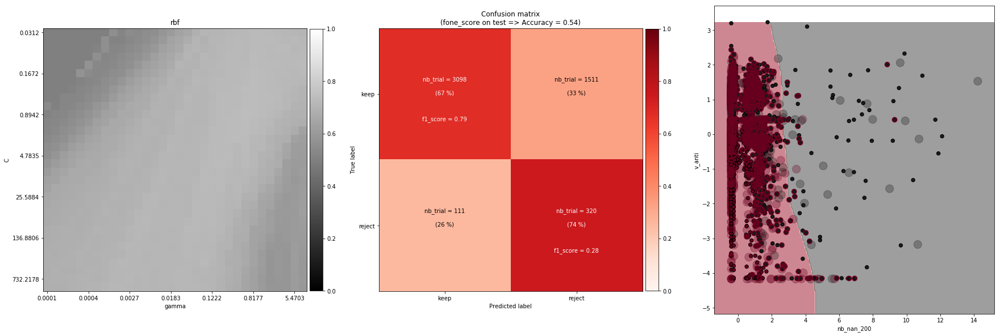

--------------------------------------------------
		nb_nan_200 - latence
--------------------------------------------------
The best parameters are {'C': 0.4572223213336258, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.74


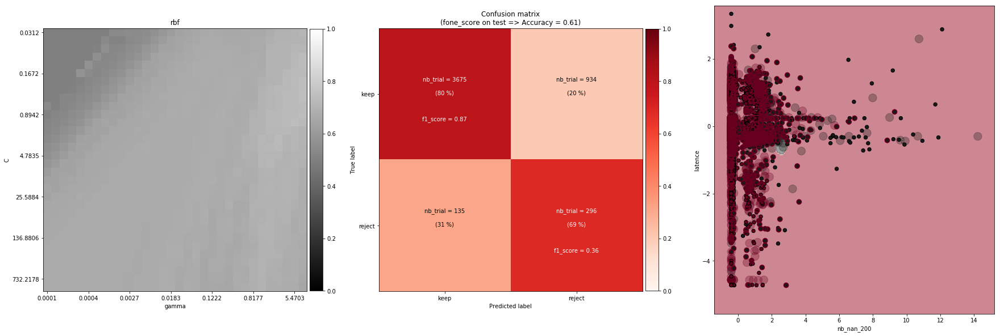

--------------------------------------------------
		nb_nan_200 - maxi
--------------------------------------------------
The best parameters are {'C': 0.32693976711264305, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.74


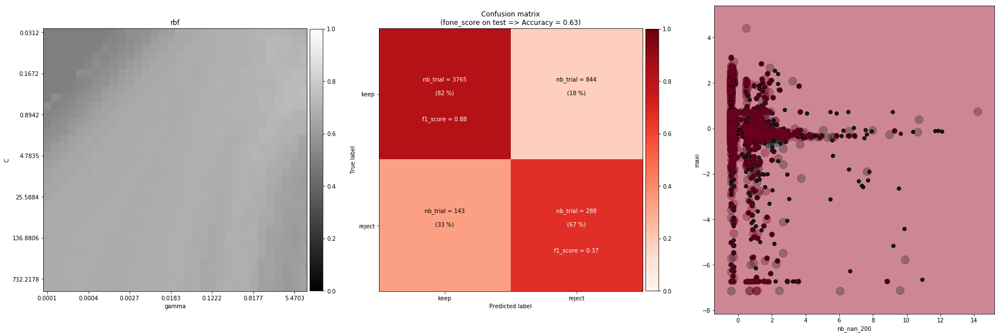

--------------------------------------------------
		nb_nan_rise - residu_GAP
--------------------------------------------------
The best parameters are {'C': 0.03125, 'gamma': 1.748904622119495, 'kernel': 'rbf'} with a score of 0.70


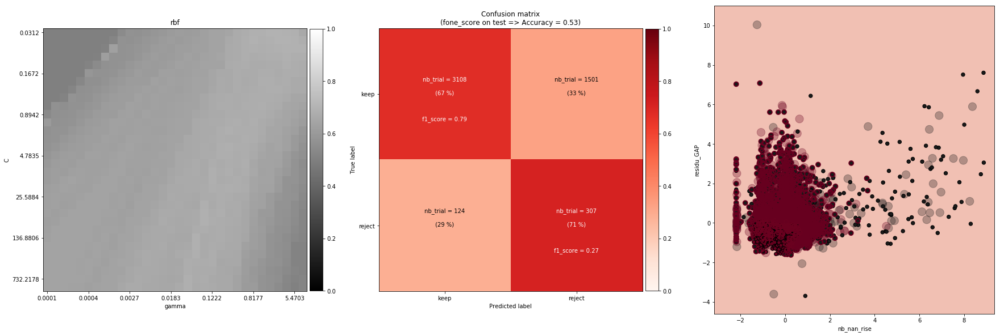

--------------------------------------------------
		nb_nan_rise - residu_anti
--------------------------------------------------
The best parameters are {'C': 267.7079419449567, 'gamma': 0.05715279016670322, 'kernel': 'rbf'} with a score of 0.72


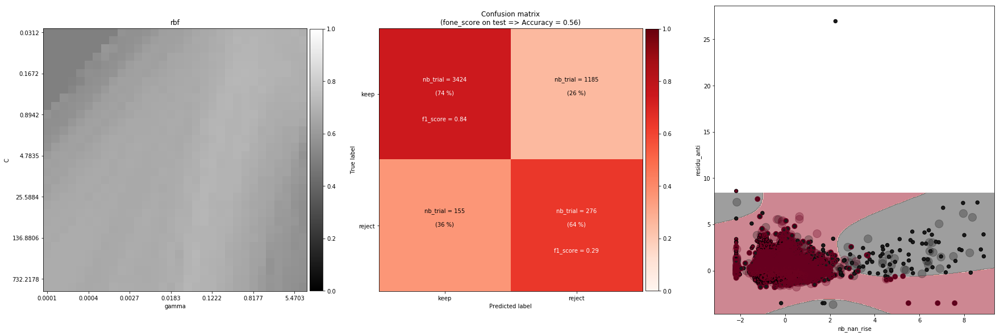

--------------------------------------------------
		nb_nan_rise - residu_200
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.72


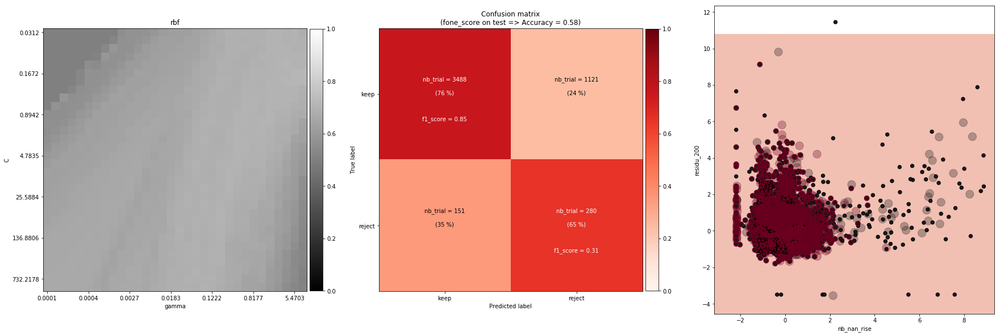

--------------------------------------------------
		nb_nan_rise - residu_rise
--------------------------------------------------
The best parameters are {'C': 0.03125, 'gamma': 1.748904622119495, 'kernel': 'rbf'} with a score of 0.71


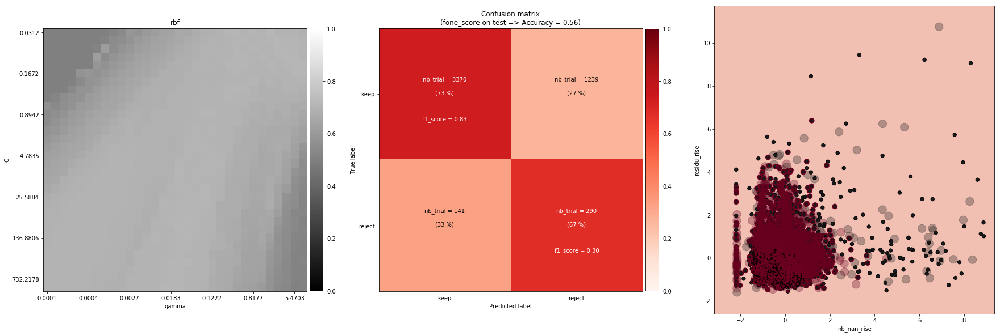

--------------------------------------------------
		nb_nan_rise - start_anti
--------------------------------------------------
The best parameters are {'C': 1.2505655196145866, 'gamma': 1.195873274044141, 'kernel': 'rbf'} with a score of 0.71


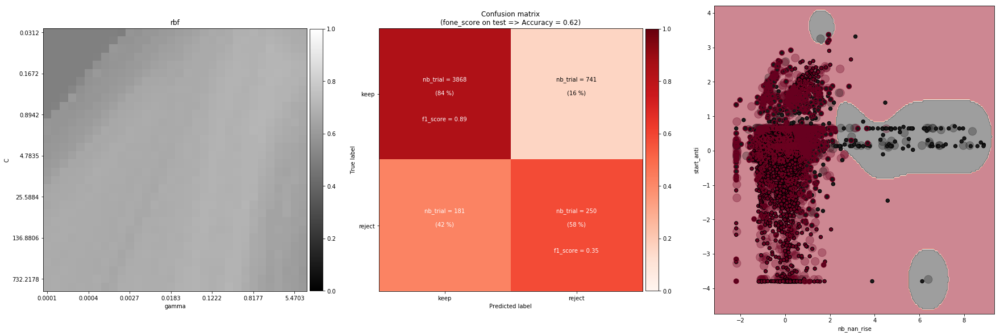

--------------------------------------------------
		nb_nan_rise - tau
--------------------------------------------------
The best parameters are {'C': 0.6394213006632598, 'gamma': 1.748904622119495, 'kernel': 'rbf'} with a score of 0.67


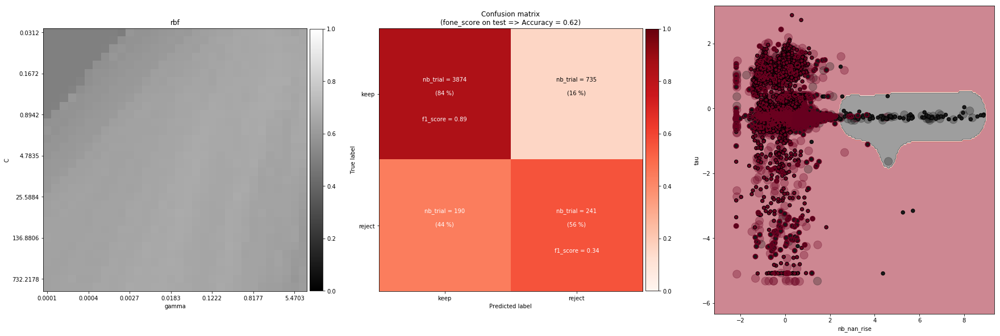

--------------------------------------------------
		nb_nan_rise - v_anti
--------------------------------------------------
The best parameters are {'C': 0.23378038720396177, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.74


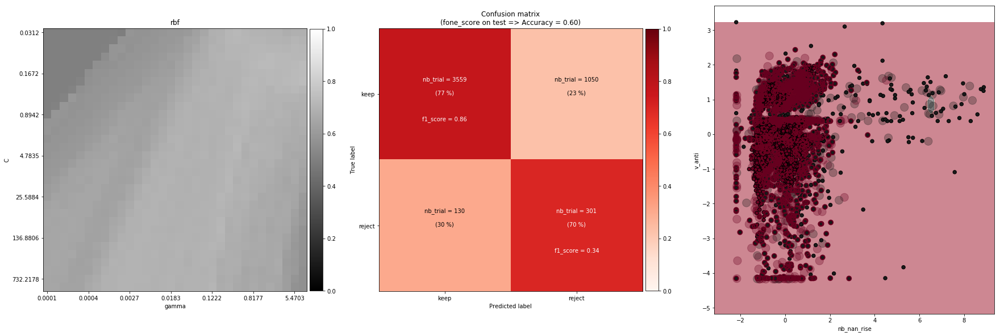

--------------------------------------------------
		nb_nan_rise - latence
--------------------------------------------------
The best parameters are {'C': 0.32693976711264305, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.70


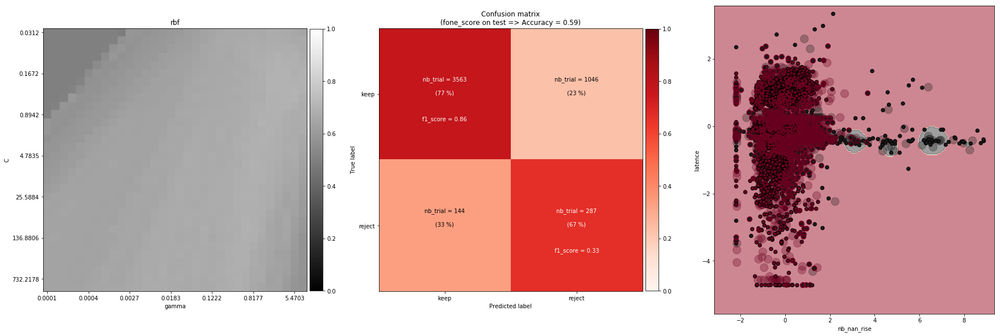

--------------------------------------------------
		nb_nan_rise - maxi
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.71


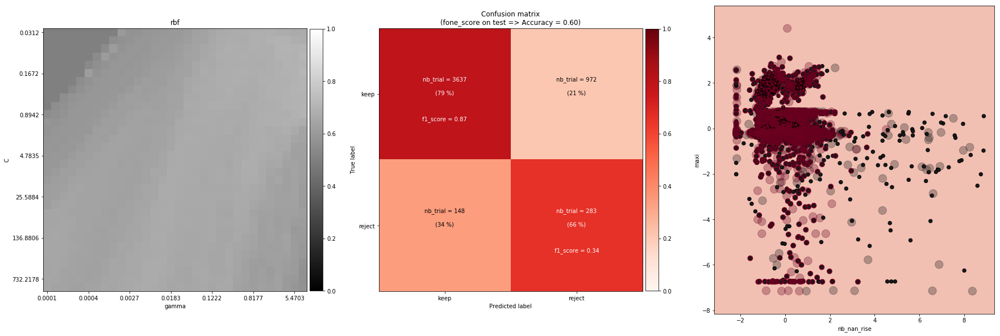

--------------------------------------------------
		residu_GAP - residu_anti
--------------------------------------------------
The best parameters are {'C': 1.2505655196145866, 'gamma': 0.08358308615055099, 'kernel': 'rbf'} with a score of 0.68


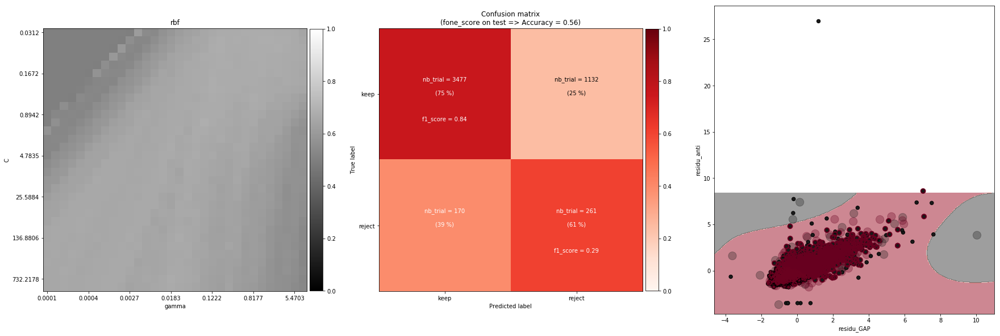

--------------------------------------------------
		residu_GAP - residu_200
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 0.8177191994837885, 'kernel': 'rbf'} with a score of 0.68


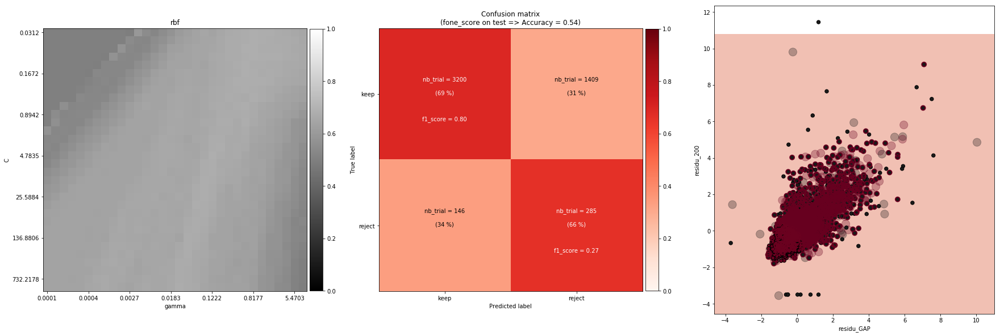

--------------------------------------------------
		residu_GAP - residu_rise
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.68


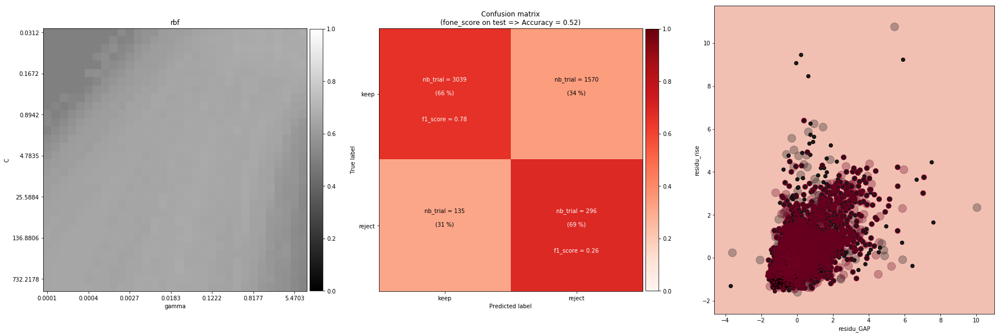

--------------------------------------------------
		residu_GAP - start_anti
--------------------------------------------------
The best parameters are {'C': 6.689672036022699, 'gamma': 0.08358308615055099, 'kernel': 'rbf'} with a score of 0.68


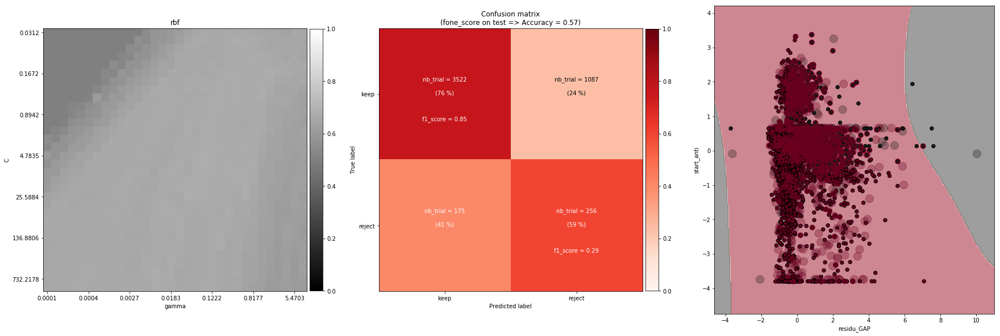

--------------------------------------------------
		residu_GAP - tau
--------------------------------------------------
The best parameters are {'C': 2.4458273711349374, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.67


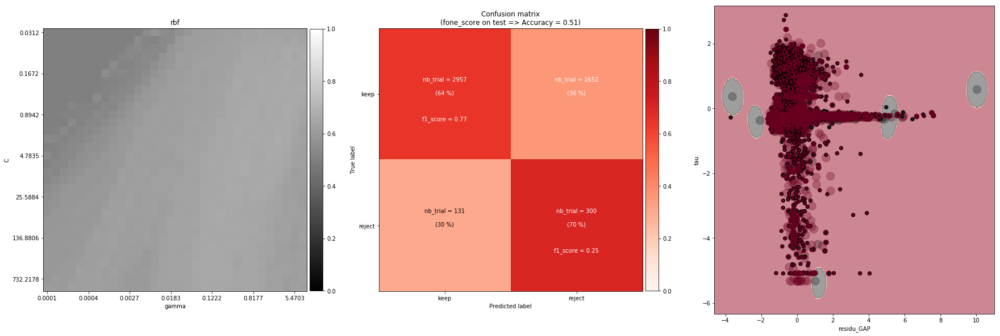

--------------------------------------------------
		residu_GAP - v_anti
--------------------------------------------------
The best parameters are {'C': 0.23378038720396177, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.68


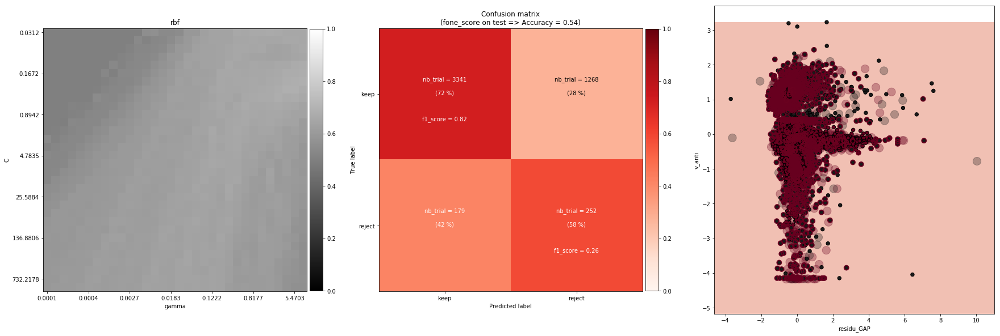

--------------------------------------------------
		residu_GAP - latence
--------------------------------------------------
The best parameters are {'C': 97.87735607267012, 'gamma': 0.1787641109466316, 'kernel': 'rbf'} with a score of 0.70


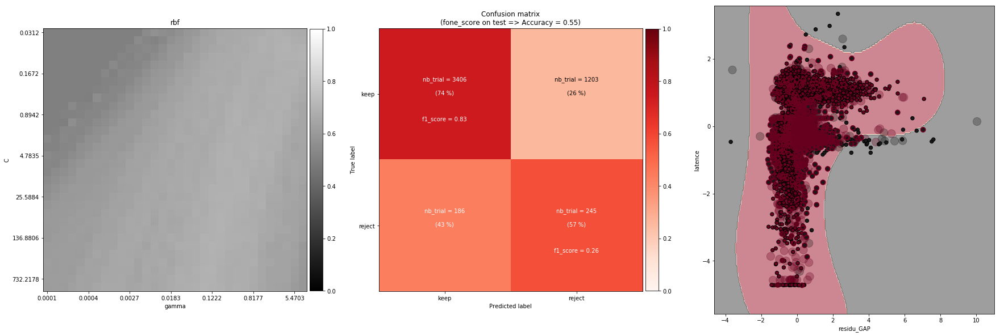

--------------------------------------------------
		residu_GAP - maxi
--------------------------------------------------
The best parameters are {'C': 0.23378038720396177, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.69


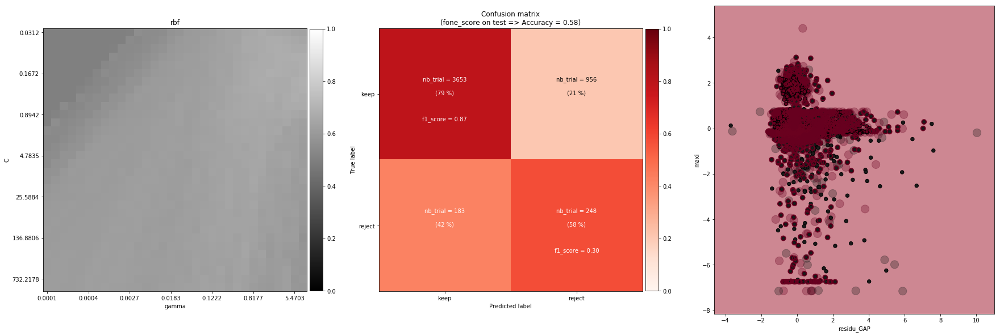

--------------------------------------------------
		residu_anti - residu_200
--------------------------------------------------
The best parameters are {'C': 0.03125, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.67


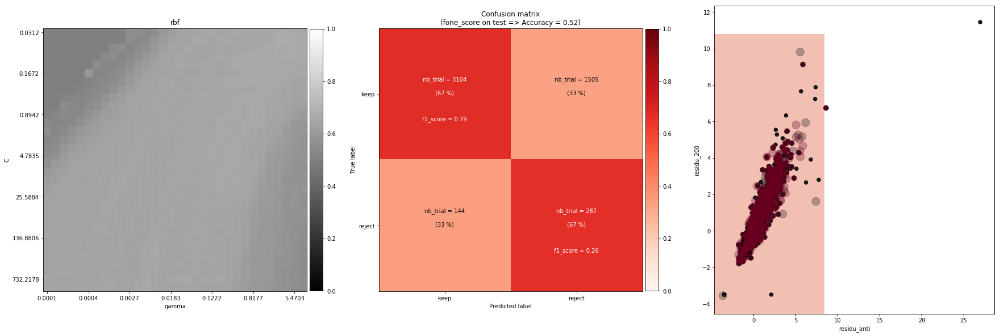

--------------------------------------------------
		residu_anti - residu_rise
--------------------------------------------------
The best parameters are {'C': 0.03125, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.68


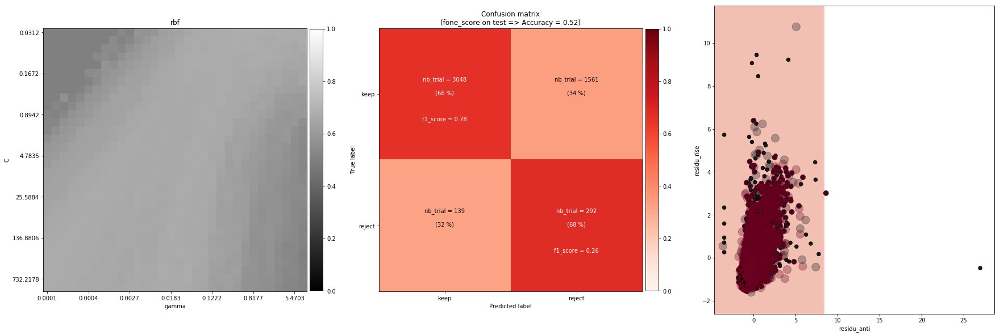

--------------------------------------------------
		residu_anti - start_anti
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 0.5591434341058171, 'kernel': 'rbf'} with a score of 0.70


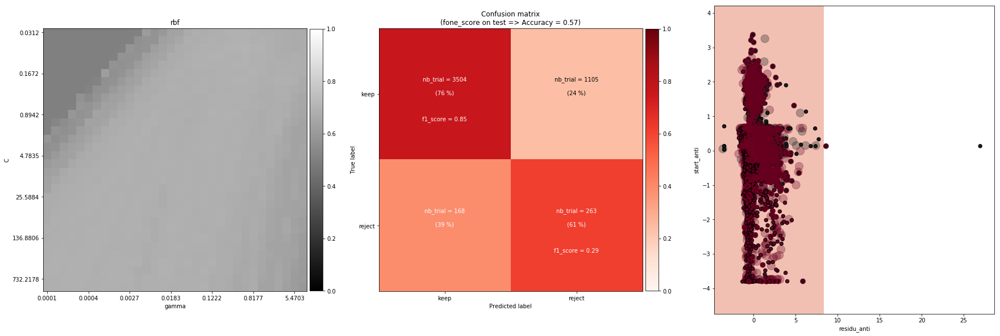

--------------------------------------------------
		residu_anti - tau
--------------------------------------------------
The best parameters are {'C': 1.7489046221194973, 'gamma': 0.5591434341058171, 'kernel': 'rbf'} with a score of 0.69


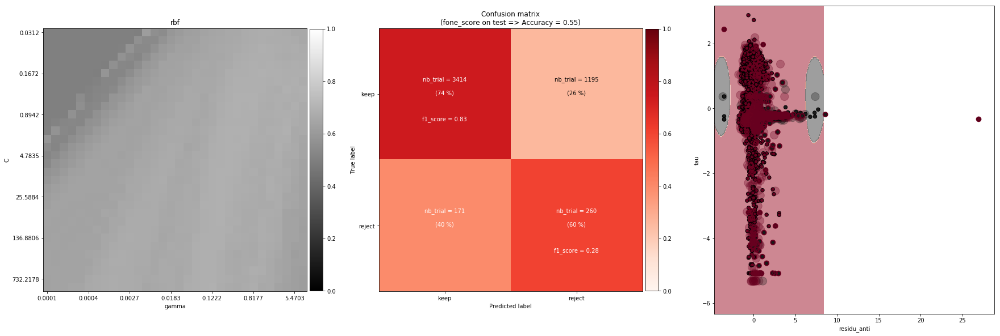

--------------------------------------------------
		residu_anti - v_anti
--------------------------------------------------
The best parameters are {'C': 0.23378038720396177, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.70


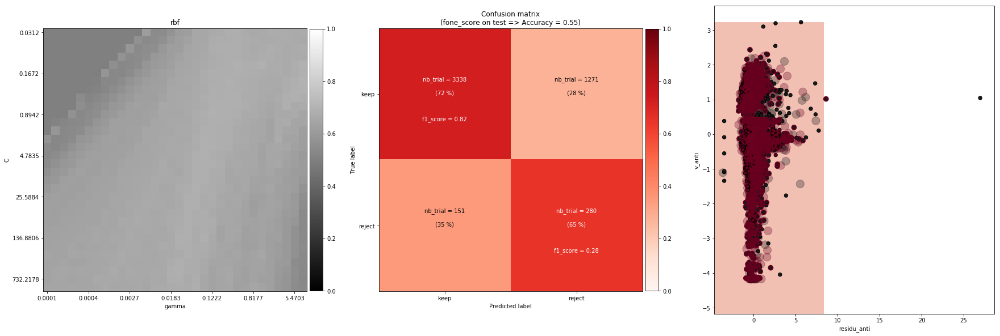

--------------------------------------------------
		residu_anti - latence
--------------------------------------------------
The best parameters are {'C': 0.11953324868703187, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.71


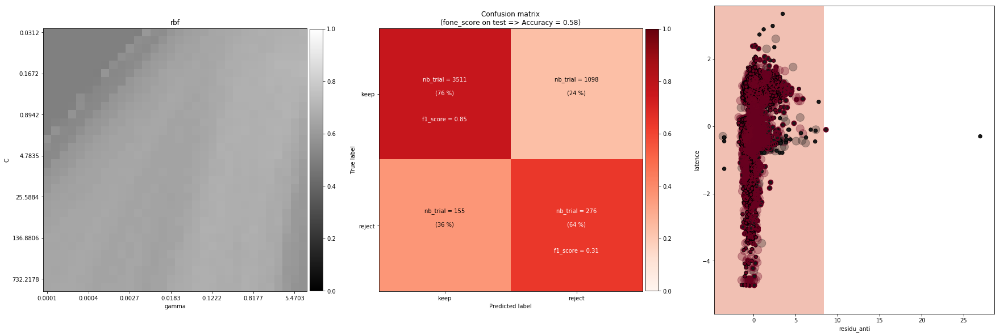

--------------------------------------------------
		residu_anti - maxi
--------------------------------------------------
The best parameters are {'C': 0.4572223213336258, 'gamma': 3.740486195263386, 'kernel': 'rbf'} with a score of 0.73


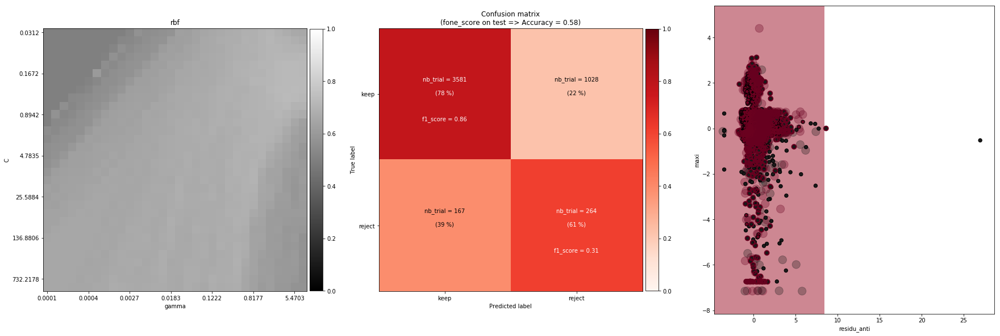

--------------------------------------------------
		residu_200 - residu_rise
--------------------------------------------------
The best parameters are {'C': 0.043702843700726655, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.69


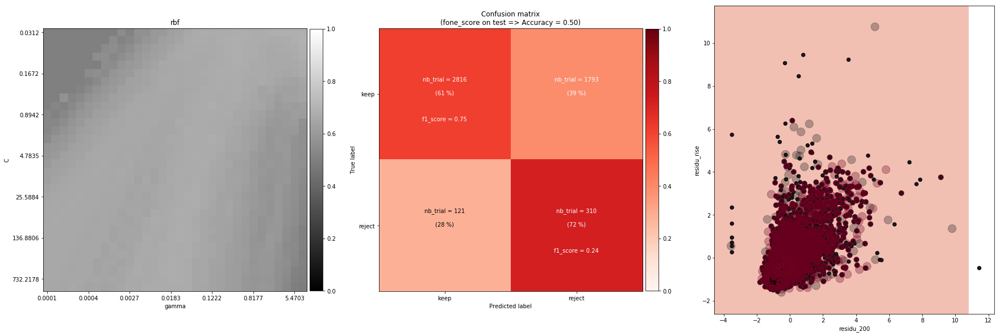

--------------------------------------------------
		residu_200 - start_anti
--------------------------------------------------
The best parameters are {'C': 25.588423395730693, 'gamma': 0.38233342215886723, 'kernel': 'rbf'} with a score of 0.70


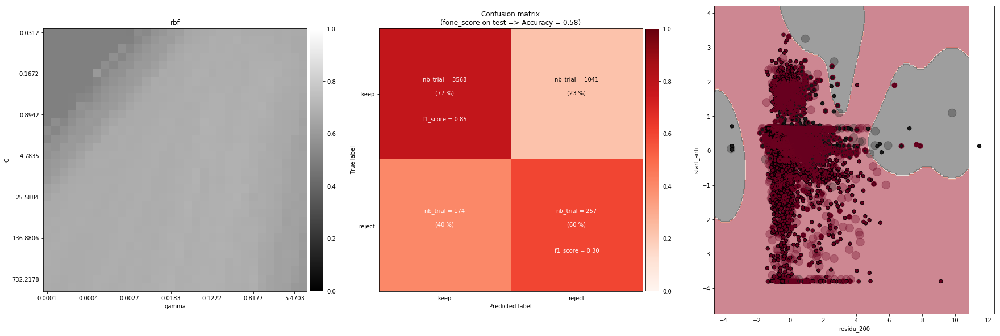

--------------------------------------------------
		residu_200 - tau
--------------------------------------------------
The best parameters are {'C': 0.4572223213336258, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.68


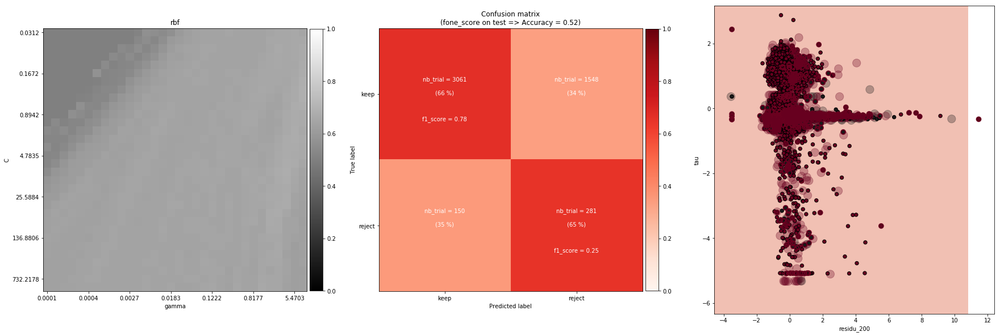

--------------------------------------------------
		residu_200 - v_anti
--------------------------------------------------
The best parameters are {'C': 0.043702843700726655, 'gamma': 0.1787641109466316, 'kernel': 'rbf'} with a score of 0.68


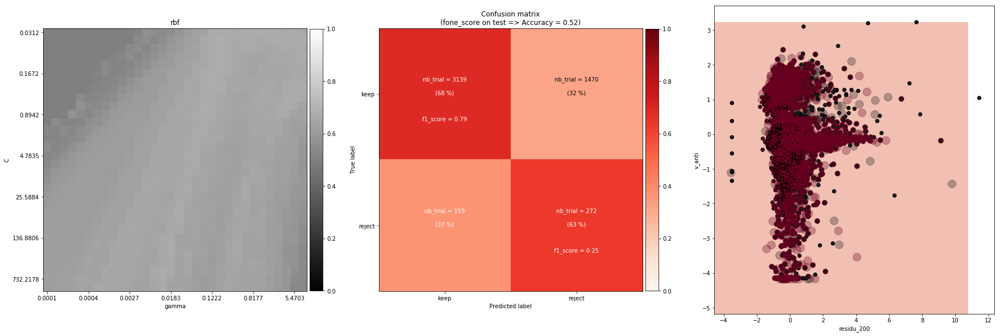

--------------------------------------------------
		residu_200 - latence
--------------------------------------------------
The best parameters are {'C': 0.11953324868703187, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.71


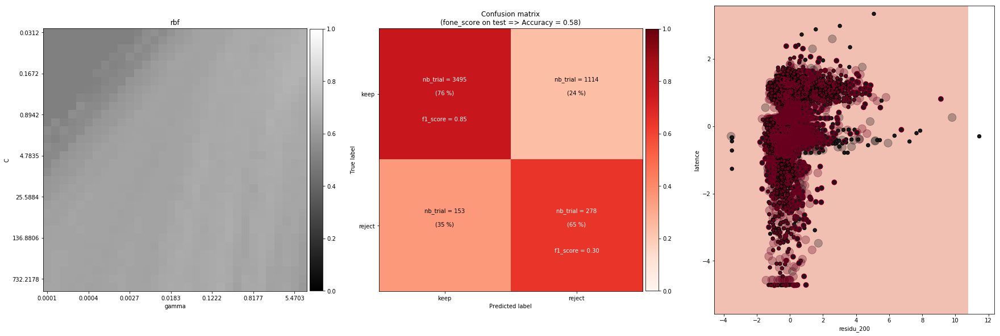

--------------------------------------------------
		residu_200 - maxi
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 0.8177191994837885, 'kernel': 'rbf'} with a score of 0.68


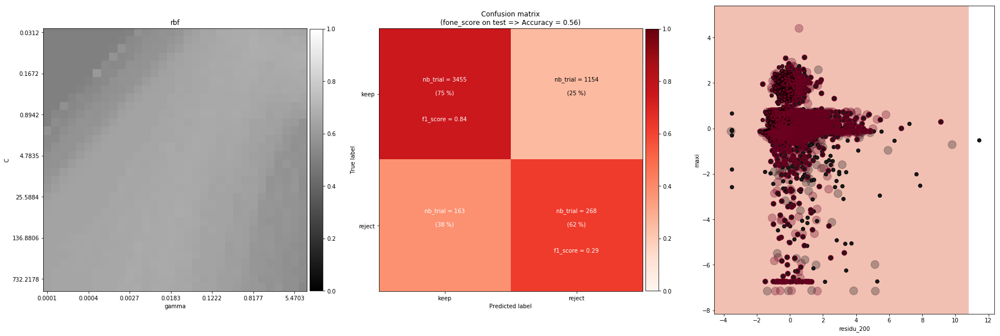

--------------------------------------------------
		residu_rise - start_anti
--------------------------------------------------
The best parameters are {'C': 523.5770550278497, 'gamma': 0.08358308615055099, 'kernel': 'rbf'} with a score of 0.68


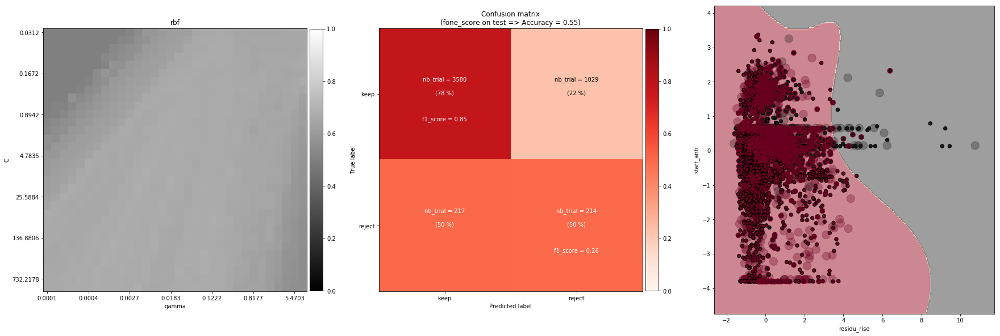

--------------------------------------------------
		residu_rise - tau
--------------------------------------------------
The best parameters are {'C': 136.88060141709667, 'gamma': 0.38233342215886723, 'kernel': 'rbf'} with a score of 0.68


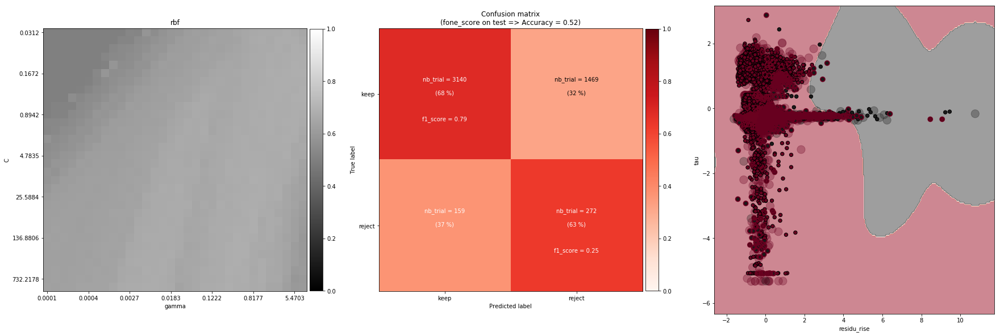

--------------------------------------------------
		residu_rise - v_anti
--------------------------------------------------
The best parameters are {'C': 0.08547301972039952, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.70


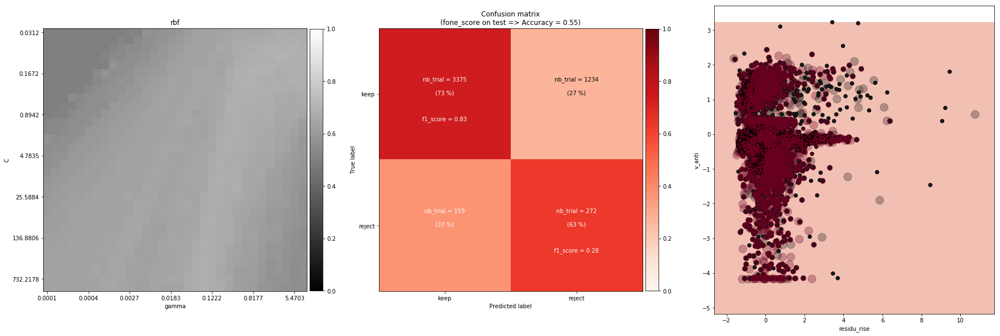

--------------------------------------------------
		residu_rise - latence
--------------------------------------------------
The best parameters are {'C': 1.2505655196145866, 'gamma': 3.740486195263386, 'kernel': 'rbf'} with a score of 0.70


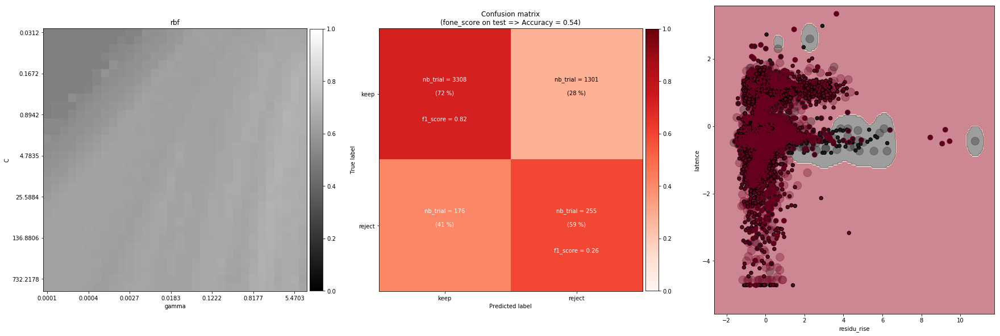

--------------------------------------------------
		residu_rise - maxi
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.72


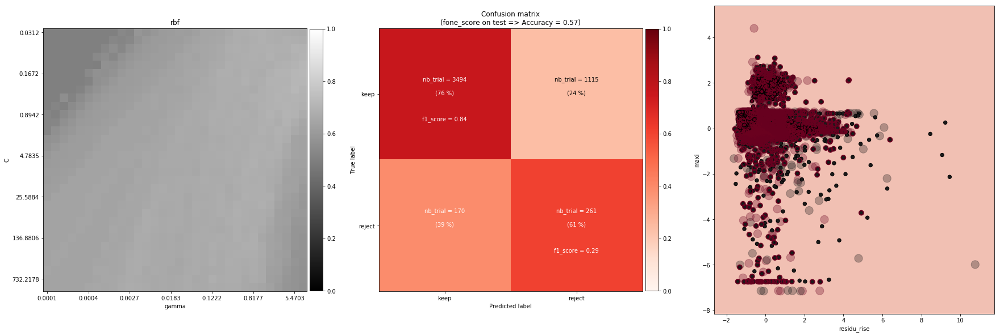

--------------------------------------------------
		start_anti - tau
--------------------------------------------------
The best parameters are {'C': 35.78517978277234, 'gamma': 3.740486195263386, 'kernel': 'rbf'} with a score of 0.67


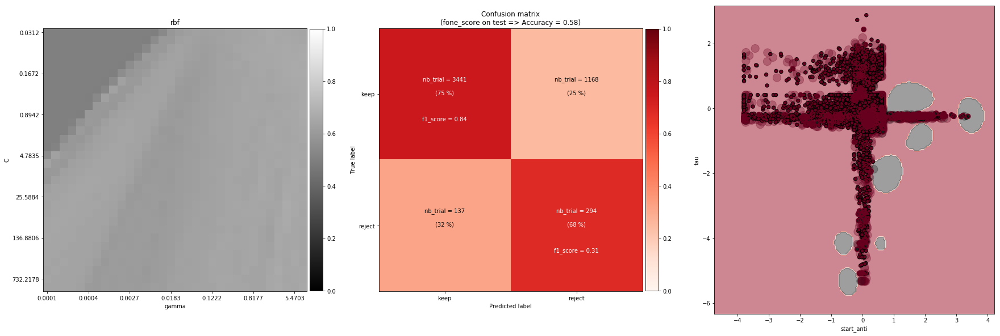

--------------------------------------------------
		start_anti - v_anti
--------------------------------------------------
The best parameters are {'C': 0.4572223213336258, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.71


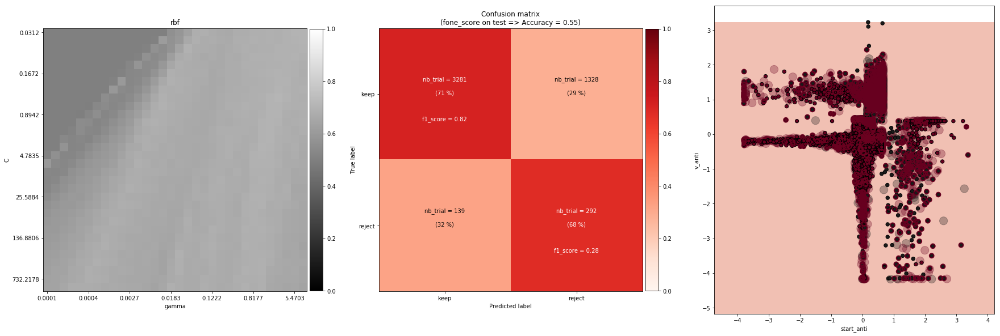

--------------------------------------------------
		start_anti - latence
--------------------------------------------------
The best parameters are {'C': 3.4204675622294167, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.69


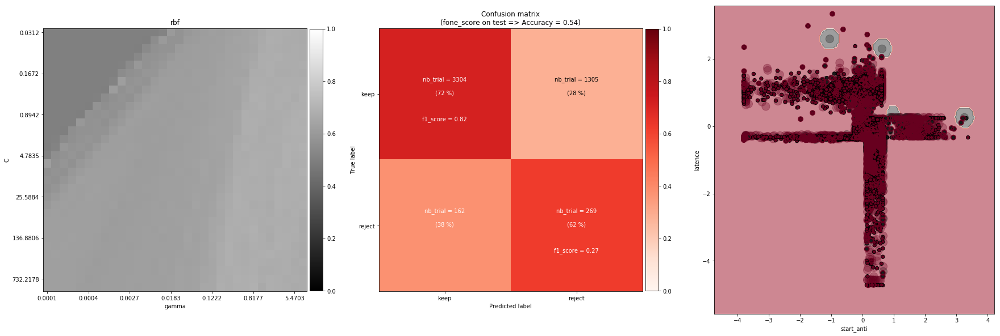

--------------------------------------------------
		start_anti - maxi
--------------------------------------------------
The best parameters are {'C': 267.7079419449567, 'gamma': 0.12223606704192902, 'kernel': 'rbf'} with a score of 0.70


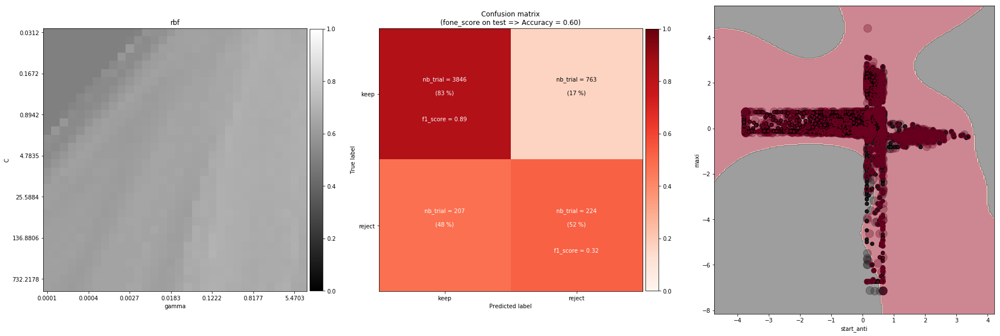

--------------------------------------------------
		tau - v_anti
--------------------------------------------------
The best parameters are {'C': 0.061118033520964545, 'gamma': 5.470273262105561, 'kernel': 'rbf'} with a score of 0.70


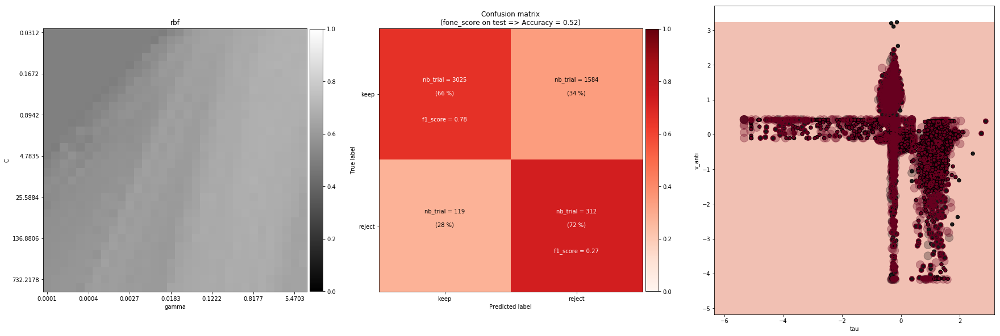

--------------------------------------------------
		tau - latence
--------------------------------------------------
The best parameters are {'C': 35.78517978277234, 'gamma': 0.8177191994837885, 'kernel': 'rbf'} with a score of 0.72


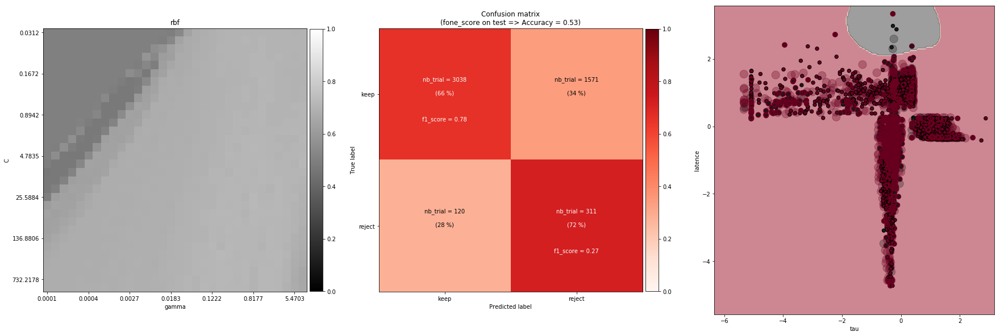

--------------------------------------------------
		tau - maxi
--------------------------------------------------
The best parameters are {'C': 0.16716617230110212, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.71


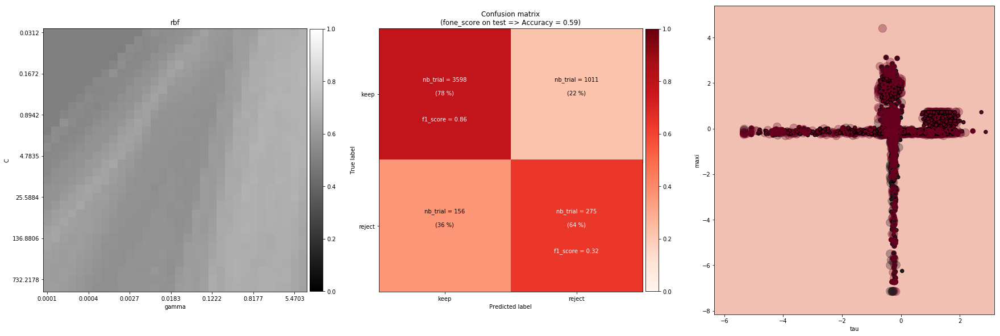

--------------------------------------------------
		v_anti - latence
--------------------------------------------------
The best parameters are {'C': 9.3554461247815, 'gamma': 2.5576852026530355, 'kernel': 'rbf'} with a score of 0.73


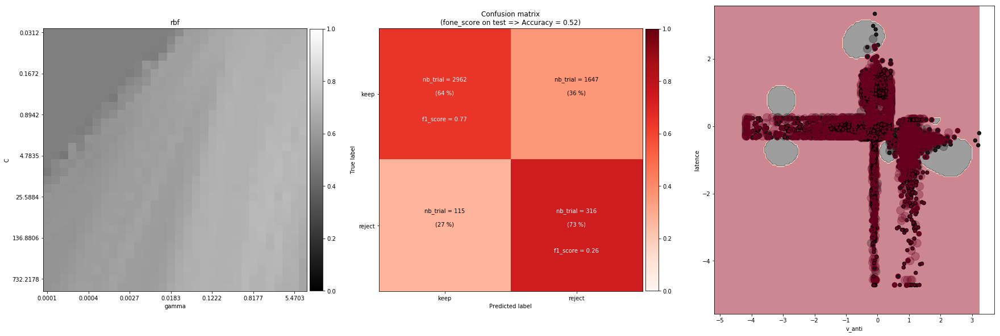

--------------------------------------------------
		v_anti - maxi
--------------------------------------------------
The best parameters are {'C': 35.78517978277234, 'gamma': 1.748904622119495, 'kernel': 'rbf'} with a score of 0.72


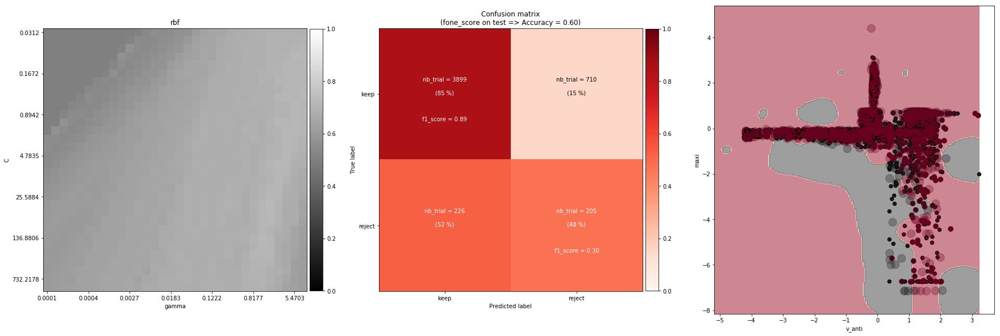

--------------------------------------------------
		latence - maxi
--------------------------------------------------
The best parameters are {'C': 9.3554461247815, 'gamma': 8.0, 'kernel': 'rbf'} with a score of 0.71


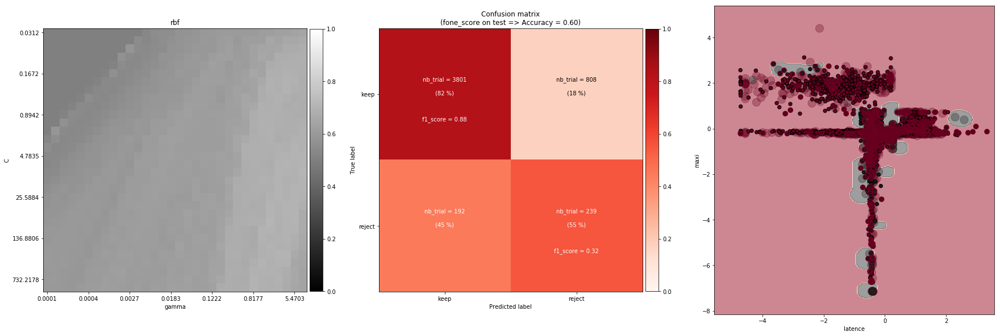

In [10]:
fig_final(X_train, y_train, X_test, y_test, var, classes)